In [1]:
import os
import os.path as osp
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
%matplotlib inline

In [3]:
#!/bin/python
# -*- coding:utf-8 -*- 

import numpy as np
import torch
from sklearn.metrics import matthews_corrcoef, confusion_matrix, roc_curve, auc, precision_recall_curve


def eval_metrics(probs, targets, cal_AUC=True):

    threshold_list = []
    for i in range(1, 100):
        threshold_list.append(i / 100.0)
    if cal_AUC:
        if isinstance(probs, torch.Tensor) and isinstance(targets, torch.Tensor):
            fpr, tpr, thresholds = roc_curve(y_true=targets.detach().cpu().numpy(),
                                             y_score=probs.detach().cpu().numpy())
        elif isinstance(probs, np.ndarray) and isinstance(targets, np.ndarray):
            fpr, tpr, thresholds = roc_curve(y_true=targets,y_score=probs)
        else:
            print('ERROR: probs or targets type is error.')
            raise TypeError
        auc_ = auc(x=fpr, y=tpr)
    else:
        auc_ = 0
    precision_1, recall_1, threshold_1 = precision_recall_curve(targets, probs)  # Precision and Recall
    aupr_1 = auc(recall_1, precision_1)
    threshold_best, rec_best, pre_best,F1_best, spe_best, mcc_best, pred_bi_best = 0, 0, 0, 0, 0, -1, None
    for threshold in threshold_list:
        acc, threshold, rec, pre,F1, spe, mcc, _, pred_bi, tn, fp, fn, tp = th_eval_metrics(threshold, probs, targets,cal_AUC=False)
        if mcc > mcc_best:
            acc, threshold_best, rec_best, pre_best, F1_best, spe_best, mcc_best, pred_bi_best, tn_, fp_, fn_, tp_ = acc, threshold, rec, pre,F1, spe, mcc, pred_bi, tn, fp, fn, tp

    return acc, threshold_best, rec_best, pre_best, F1_best, spe_best, mcc_best, auc_, pred_bi_best, aupr_1, tn_, fp_, fn_, tp_

def th_eval_metrics(threshold, probs, targets,cal_AUC=True):
    if isinstance(probs, torch.Tensor) and isinstance(targets,torch.Tensor):
        if cal_AUC:
            fpr, tpr, thresholds = roc_curve(y_true=targets.detach().cpu().numpy(), y_score=probs.detach().cpu().numpy())
            auc_ = auc(x=fpr, y=tpr)
        else:
            auc_ = 0
        pred_bi = targets.data.new(probs.shape).fill_(0)
        pred_bi[probs>threshold] = 1
        targets[targets==0] = 5
        targets[targets==1] = 10
        tn = torch.where((pred_bi+targets)==5)[0].shape[0]
        fp = torch.where((pred_bi+targets)==6)[0].shape[0]
        fn = torch.where((pred_bi+targets)==10)[0].shape[0]
        tp = torch.where((pred_bi+targets)==11)[0].shape[0]
        if tp>0:
            rec = tp / (tp + fn)
        else:
            rec = 0
        if tp > 0:
            pre = tp / (tp + fp)
        else:
            pre = 0
        if tn > 0:
            spe = tn / (tn + fp)
        else:
            spe = 0
        if rec+pre > 0:
            F1 = 2 * rec * pre / (rec + pre)
        else:
            F1 = 0
        acc = (tp + tn)/(tp + tn + fp + fn)
        mcc = (tp*tn-fp*fn)/torch.sqrt((tp+fp)*(tp+fn)*(tn+fp)*(tn+fn))

    elif isinstance(probs, np.ndarray) and isinstance(targets, np.ndarray):
        if cal_AUC:
            fpr, tpr, thresholds = roc_curve(y_true=targets, y_score=probs)
            auc_ = auc(x=fpr, y=tpr)
        else:
            auc_ = 0
        pred_bi = np.abs(np.ceil(probs - threshold))
        cm = confusion_matrix(targets, pred_bi)
        tn, fp, fn, tp = confusion_matrix(targets, pred_bi).ravel()
        if tp >0 :
            rec = tp / (tp + fn)
        else:
            rec = 1e-8
        if tp >0:
            pre = tp / (tp + fp)
        else:
            pre = 1e-8
        if tn>0:
            spe = tn / (tn + fp)
        else:
            spe = 1e-8
        acc = (tp + tn)/(tp + tn + fp + fn)
        mcc = matthews_corrcoef(targets, pred_bi)
        if rec + pre > 0:
            F1 = 2 * rec * pre / (rec + pre)
        else:
            F1 = 0
    else:
        print('ERROR: probs or targets type is error.')
        raise TypeError

    return acc, threshold, rec, pre, F1, spe, mcc, auc_, pred_bi, tn, fp, fn, tp




/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


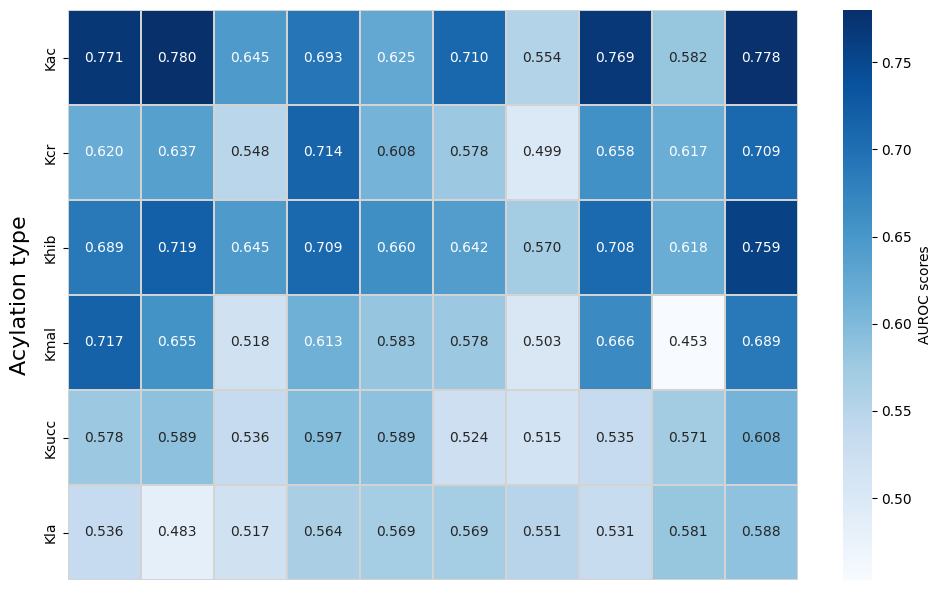

In [9]:
data2 = {
    'BINA': [0.771, 0.620, 0.689, 0.717, 0.578, 0.536],
    'BLOSUM62': [0.780, 0.637, 0.719, 0.655, 0.589, 0.483],
    'CKSAAP': [0.645, 0.548, 0.645, 0.518, 0.536, 0.517],
    'CTD': [0.693, 0.714, 0.709, 0.613, 0.597, 0.564],
    'EBGW': [0.625, 0.608, 0.660, 0.583, 0.589, 0.569],
    'ARPC': [0.710, 0.578, 0.642, 0.578, 0.524, 0.569],
    'PWAA': [0.554, 0.499, 0.570, 0.503, 0.515, 0.551],
    'PCP': [0.769, 0.658, 0.708, 0.666, 0.535, 0.531],
    'CC': [0.582, 0.617, 0.618, 0.453, 0.571, 0.581],
    'Fusion': [0.778, 0.709, 0.759, 0.689, 0.608, 0.588]
}

# Create a DataFrame
df2 = pd.DataFrame(data2, index=['Kac', 'Kcr', 'Khib', 'Kmal', 'Ksucc', 'Kla'])

# Plot heatmap
plt.figure(figsize=(10, 6))

sns.heatmap(df2, annot=True, cmap='Blues', fmt=".3f", cbar_kws={'label': 'AUROC scores'}, linewidths=0.01, linecolor='lightgray')
# plt.xlabel('Feature', fontsize=12, labelpad=10)
plt.xticks([])
plt.ylabel('Acylation type', fontsize=16, labelpad=10)
plt.tight_layout()
plt.savefig('AUROC_feature_heatmap.png', dpi=600)

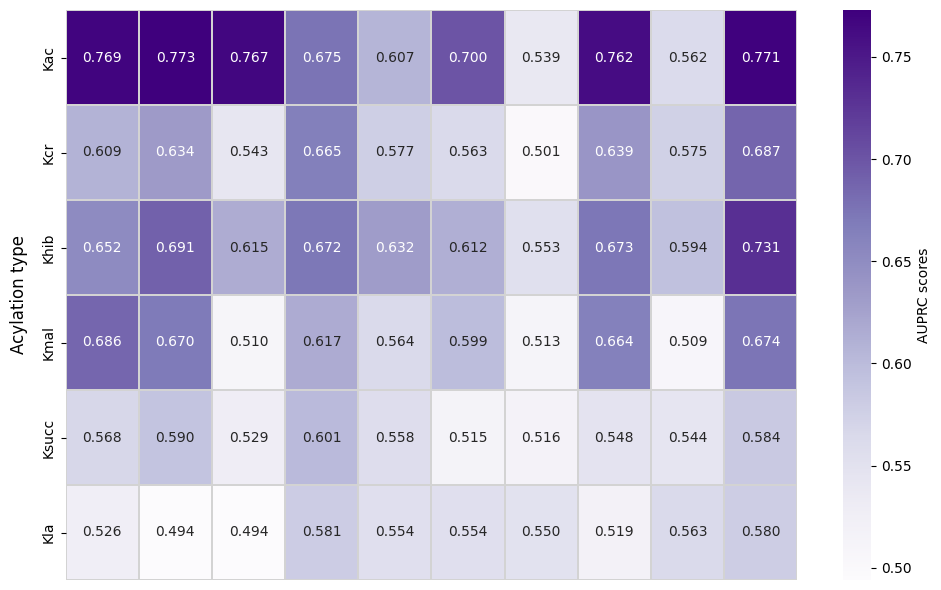

In [147]:
data3 = {
    'BINA': [0.769, 0.609, 0.652, 0.686, 0.568, 0.526],
    'BLOSUM62': [0.773, 0.634, 0.691, 0.670, 0.590, 0.494],
    'CKSAAP': [0.767, 0.543, 0.615, 0.510, 0.529, 0.494],
    'CTD': [0.675, 0.665, 0.672, 0.617, 0.601, 0.581],
    'EBGW': [0.607, 0.577, 0.632, 0.564, 0.558, 0.554],
    'ARPC': [0.700, 0.563, 0.612, 0.599, 0.515, 0.554],
    'PWAA': [0.539, 0.501, 0.553, 0.513, 0.516, 0.550],
    'PCP': [0.762, 0.639, 0.673, 0.664, 0.548, 0.519],
    'CC': [0.562, 0.575, 0.594, 0.509, 0.544, 0.563],
    'Fusion': [0.771, 0.687, 0.731, 0.674, 0.584, 0.580]
}

# Create a DataFrame with the updated data
df2 = pd.DataFrame(data3, index=['Kac', 'Kcr', 'Khib', 'Kmal', 'Ksucc', 'Kla'])
# Plot heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(df2, annot=True, cmap='Purples', fmt=".3f", cbar_kws={'label': 'AUPRC scores'}, linewidths=0.01, linecolor='lightgray')
plt.ylabel('Acylation type', fontsize=12, labelpad=10)
plt.xticks([])
plt.tight_layout()
plt.savefig('AUPRC_feature_heatmap.png', dpi=600)

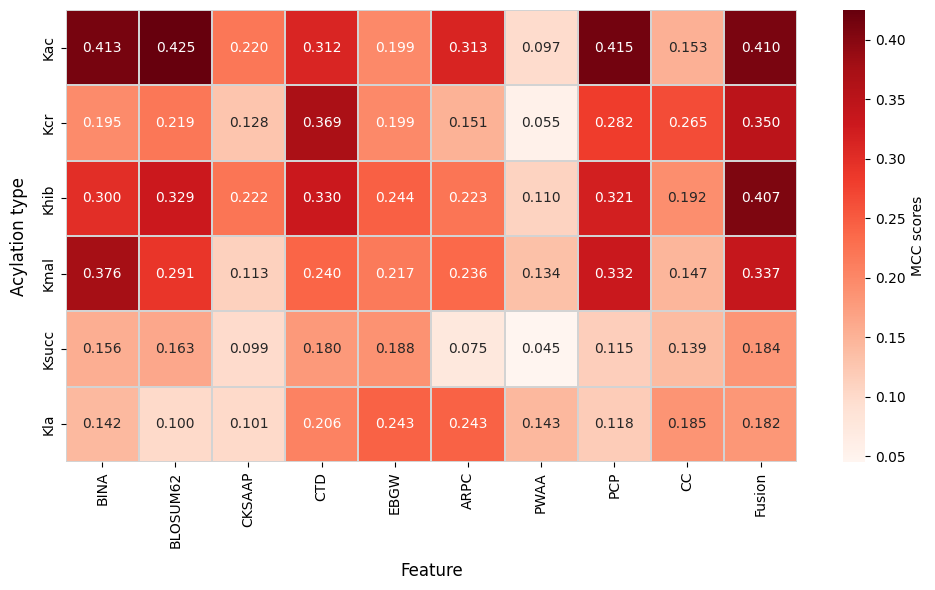

In [146]:
data = {
    'BINA': [0.413, 0.195, 0.300, 0.376, 0.156, 0.142],
    'BLOSUM62': [0.425, 0.219, 0.329, 0.291, 0.163, 0.100],
    'CKSAAP': [0.220, 0.128, 0.222, 0.113, 0.099, 0.101],
    'CTD': [0.312, 0.369, 0.330, 0.240, 0.180, 0.206],
    'EBGW': [0.199, 0.199, 0.244, 0.217, 0.188, 0.243],
    'ARPC': [0.313, 0.151, 0.223, 0.236, 0.075, 0.243],
    'PWAA': [0.097, 0.055, 0.110, 0.134, 0.045, 0.143],
    'PCP': [0.415, 0.282, 0.321, 0.332, 0.115, 0.118],
    'CC': [0.153, 0.265, 0.192, 0.147, 0.139, 0.185],
    'Fusion': [0.410, 0.350, 0.407, 0.337, 0.184, 0.182]
}

# 创建一个DataFrame
df = pd.DataFrame(data, index=['Kac', 'Kcr', 'Khib', 'Kmal', 'Ksucc', 'Kla'])

# 绘制热图
plt.figure(figsize=(10, 6))
sns.heatmap(df, annot=True, cmap='Reds', fmt=".3f", cbar_kws={'label': 'MCC scores'}, linewidths=0.01, linecolor='lightgray')
# plt.xlabel('Feature', fontsize=12, labelpad=10)
plt.xlabel('Feature', fontsize=12, labelpad=10)
plt.ylabel('Acylation type', fontsize=12, labelpad=10)
plt.tight_layout()
plt.savefig('MCC_feature_heatmap.png', dpi=600)

In [ ]:
# 1:1 AUROC

/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


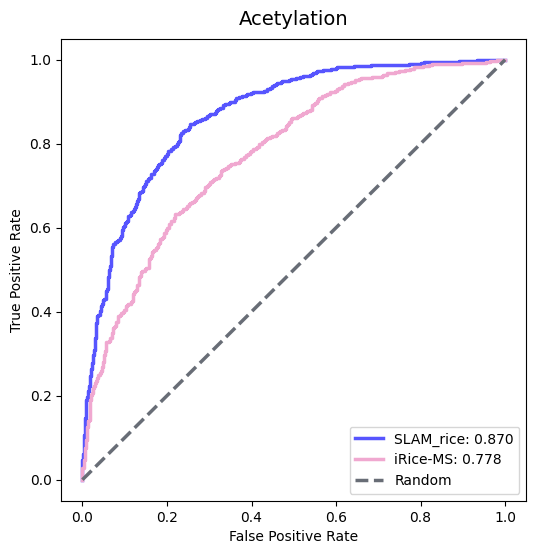

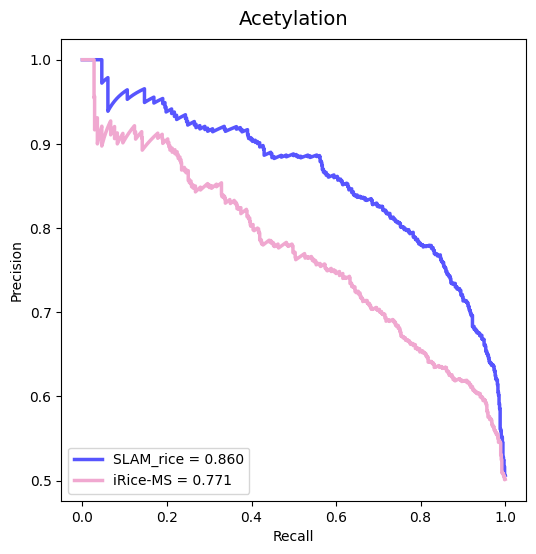

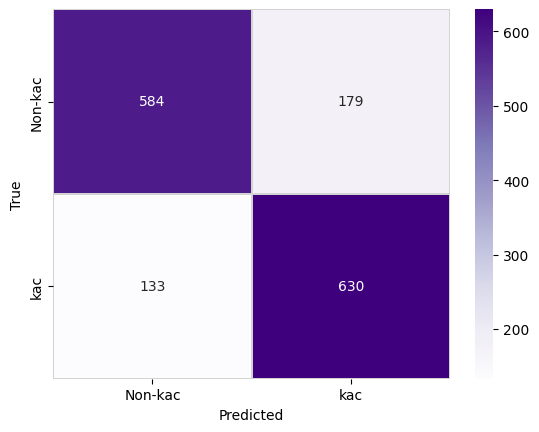

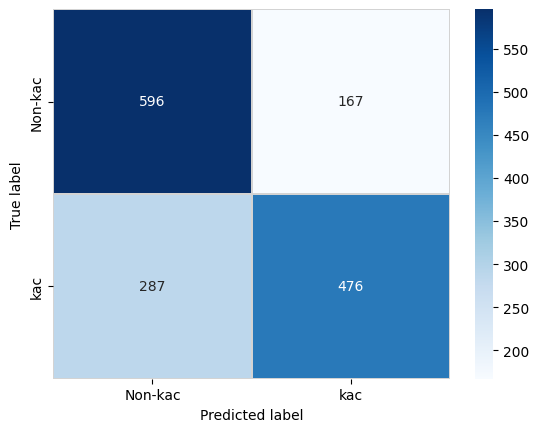

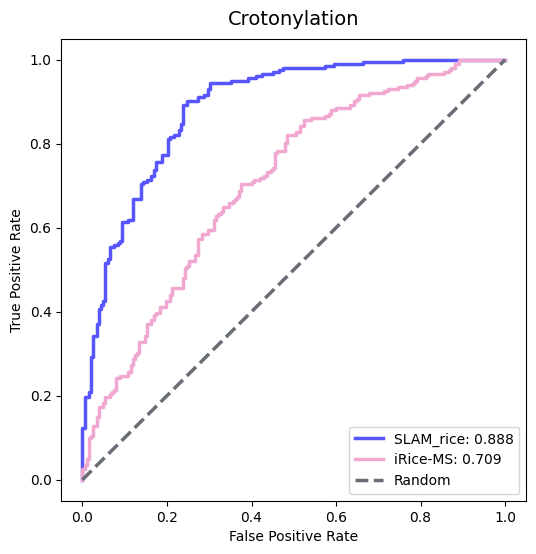

...

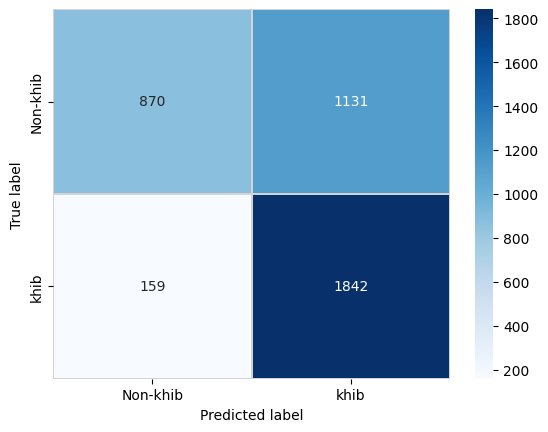

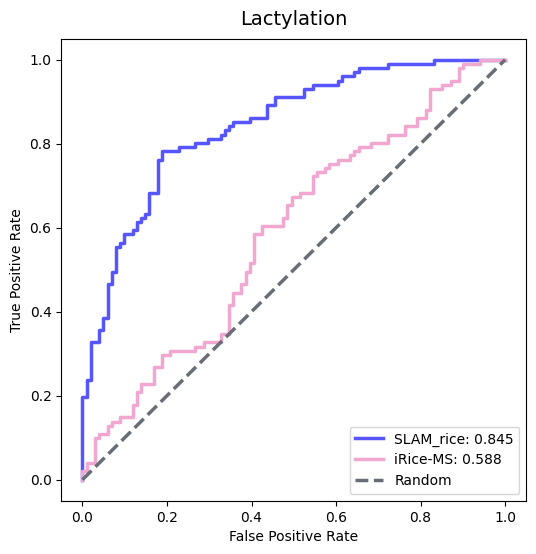

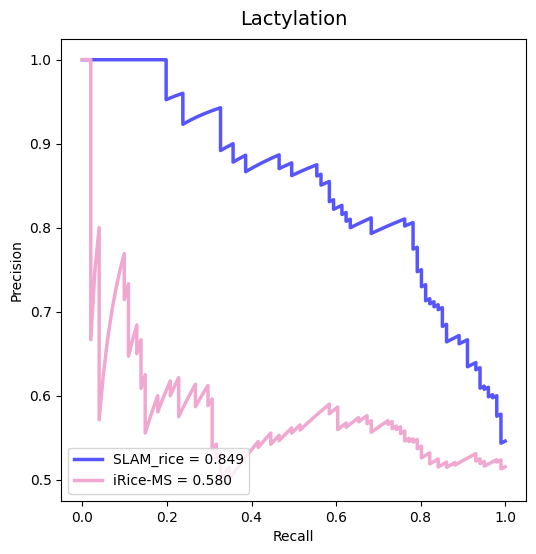

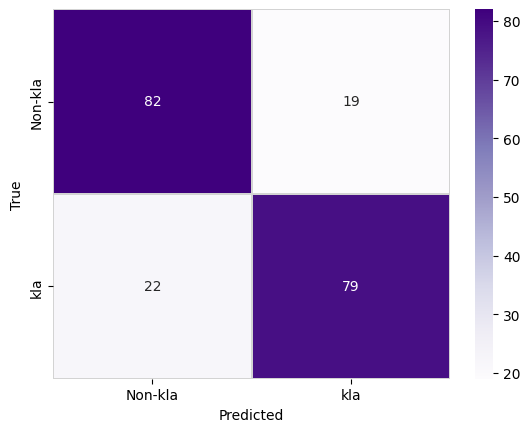

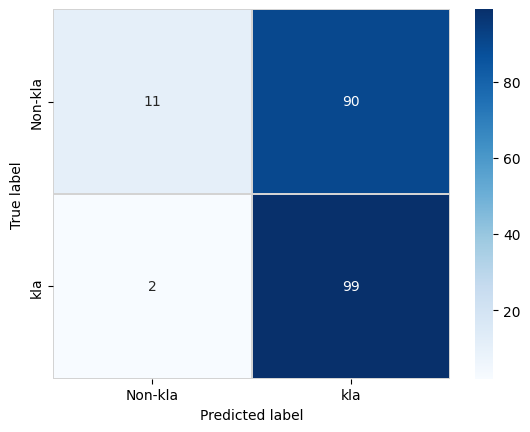

In [12]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc, precision_recall_curve, average_precision_score, confusion_matrix
import seaborn as sns

ratio = '1'
pdict = {'kac':'Acetylation', 'kcr':'Crotonylation', 'kmal':'Malonylation', 'ksucc':'Succinylation', 'khib':'2-Hydroxyisobutyrylation', 'kla':'Lactylation'}

for ptm in ['kac', 'kcr', 'kmal', 'ksucc', 'khib', 'kla']:
    my_result = f'/home/zhqin/project/2024/01.SLAM/RicePTM_result/ratio_{ratio}_transfer/SLAM_seq/{ptm}_logits_results.txt'
    iriceMS_result = f'/home/zhqin/project/2024/01.SLAM/RicePTM/feature_extraction/{ptm}_ratio_{ratio}_fusion.csv'
    df1 = pd.read_csv(my_result, sep='\t')
    df2 = pd.read_csv(iriceMS_result, sep=',')
    
    # ROC Curve for SLAM_rice
    y_true = df1['Label']
    y_scores = df1['Logit']
    fpr, tpr, _ = roc_curve(y_true, y_scores)
    roc_auc = auc(fpr, tpr)
    
    # Plot ROC for SLAM_rice
    plt.figure(figsize=(6, 6))    
    plt.plot(fpr, tpr, color='#5755FE', lw=2.5, label=f'SLAM_rice: {roc_auc:.3f}')
    
    # ROC Curve for iRice-MS
    y_true = df2['Label']
    y_scores = df2['Pred']
    fpr, tpr, _ = roc_curve(y_true, y_scores)
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, color='#F0A8D0', lw=2.5, label=f'iRice-MS: {roc_auc:.3f}')
    
    # Random classifier ROC Curve (y = x)
    fpr_random = np.linspace(0, 1, 100)
    tpr_random = fpr_random  # Random classifier line: y = x (random guessing)
    roc_auc_random = 0.5  # AUC of 0.5 represents random classification
    plt.plot(fpr_random, tpr_random, color='#686D76', linestyle='--', lw=2.5, label=f'Random')
    
    # Title, labels, and legend for ROC curve
    plt.title(f'{pdict[ptm]}', pad=10, fontsize=14)
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.legend(loc='lower right')
    plt.savefig(f'plot/perf/{ratio}_{ptm}_auroc.png', dpi=600)
    
    # Precision-Recall Curve for SLAM_rice
    precision1, recall1, _ = precision_recall_curve(df1['Label'], df1['Logit'])
    auprc1 = auc(recall1, precision1)

    # Precision-Recall Curve for iRice-MS
    precision2, recall2, _ = precision_recall_curve(df2['Label'], df2['Pred'])
    auprc2 = auc(recall2, precision2)
    # Plot Precision-Recall Curve
    plt.figure(figsize=(6, 6))
    plt.plot(recall1, precision1, color='#5755FE', lw=2.5, label=f'SLAM_rice = {auprc1:.3f}')
    plt.plot(recall2, precision2, color='#F0A8D0', lw=2.5, label=f'iRice-MS = {auprc2:.3f}')
    
    # Title, labels, and legend for PRC
    plt.title(f'{pdict[ptm]}', pad=10, fontsize=14)
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.legend(loc='lower left')
    plt.savefig(f'plot/perf/{ratio}_{ptm}_auprc.png', dpi=600)
    
    # Confusion Matrix for SLAM_rice
    acc_, th_, rec_, pre_, f1_, spe_, mcc_, auc_, pred_class, auprc_, tn, fp, fn, tp = eval_metrics(df1['Logit'].to_numpy(), df1['Label'].to_numpy())
    cm1 = np.array([[tn,fp],[fn,tp]])
    # Confusion Matrix for iRice-MS
    acc_, th_, rec_, pre_, f1_, spe_, mcc_, auc_, pred_class, auprc_, tn, fp, fn, tp = eval_metrics(df2['Pred'].to_numpy(), df2['Label'].to_numpy())
    cm2 = np.array([[tn,fp],[fn,tp]])
    # Plot Confusion Matrix for SLAM_rice
    plt.figure()
    sns.heatmap(cm1, annot=True, fmt='d', cmap='Purples', cbar=True, xticklabels=[f'Non-{ptm}', f'{ptm}'], yticklabels=[f'Non-{ptm}', f'{ptm}'], linewidths=0.1, linecolor='lightgray')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.savefig(f'plot/perf/{ratio}_{ptm}_slam_rice_cm.png', dpi=600)
    
    # Plot Confusion Matrix for iRice-MS
    plt.figure()
    sns.heatmap(cm2, annot=True, fmt='d', cmap='Blues', cbar=True, xticklabels=[f'Non-{ptm}', f'{ptm}'], yticklabels=[f'Non-{ptm}', f'{ptm}'], linewidths=0.1, linecolor='lightgray')
#     plt.title(f'Confusion Matrix for iRice-MS: {pdict[ptm]}', fontsize=14)
    plt.xlabel('Predicted label')
    plt.ylabel('True label')
    plt.savefig(f'plot/perf/{ratio}_{ptm}_irice_ms_cm.png', dpi=600)

/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/ipykernel_launcher.py:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  from ipykernel import kernelapp as app


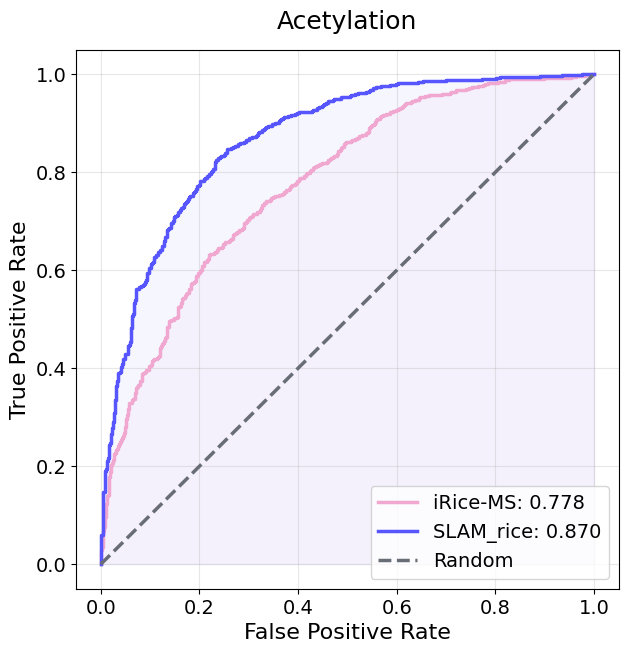

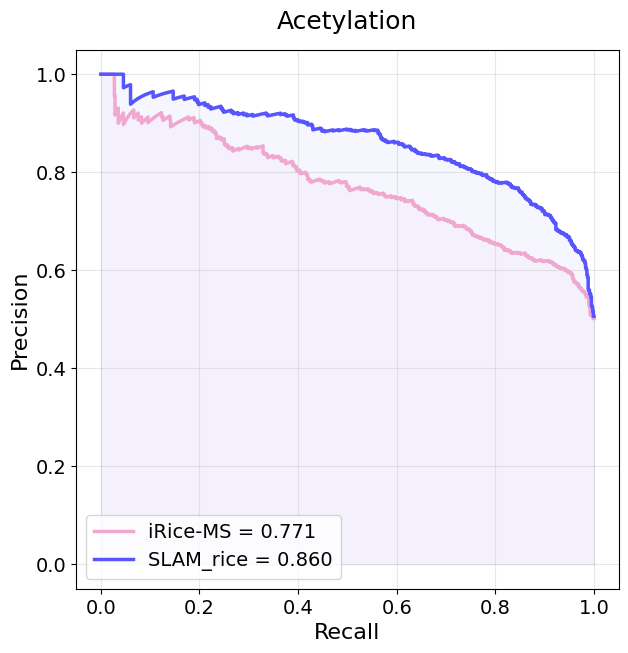

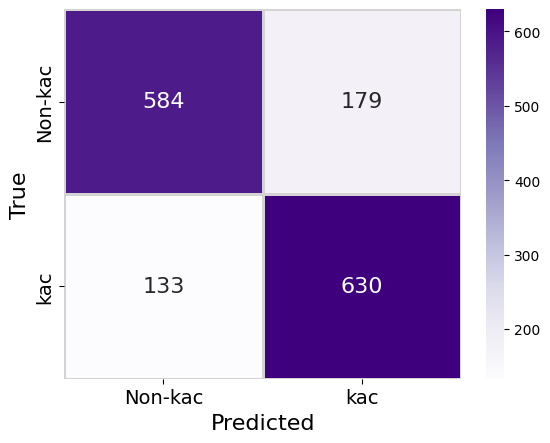

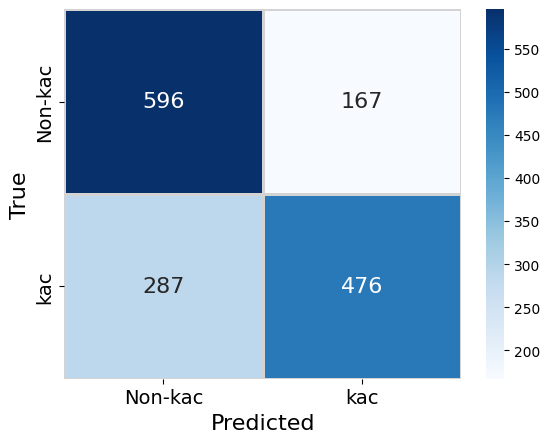

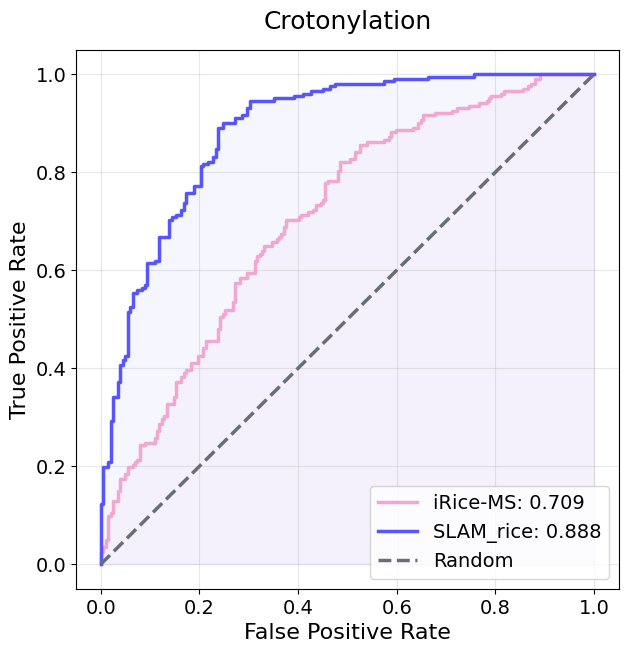

...

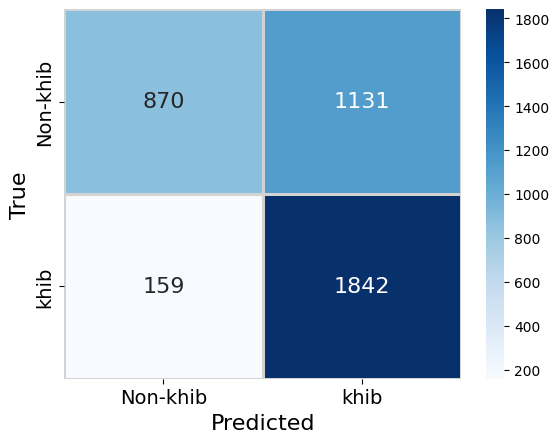

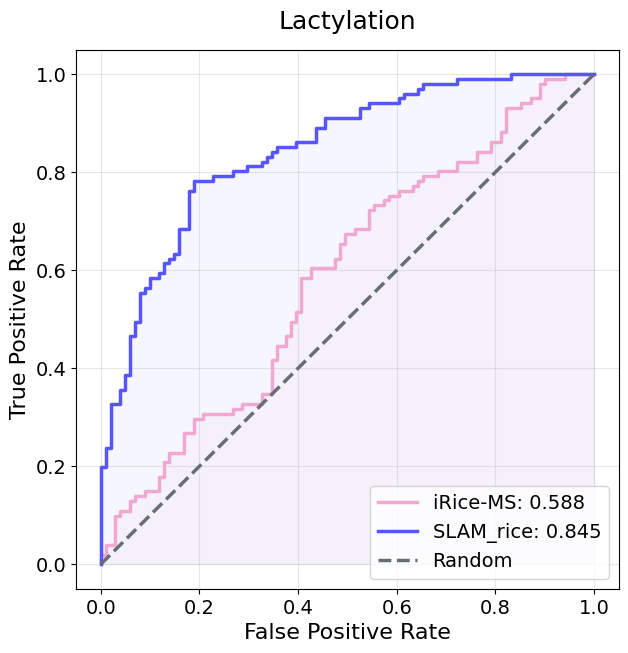

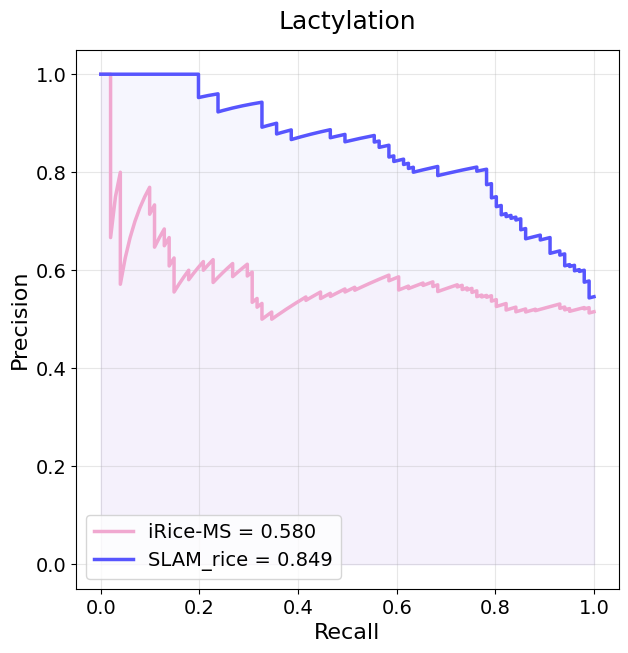

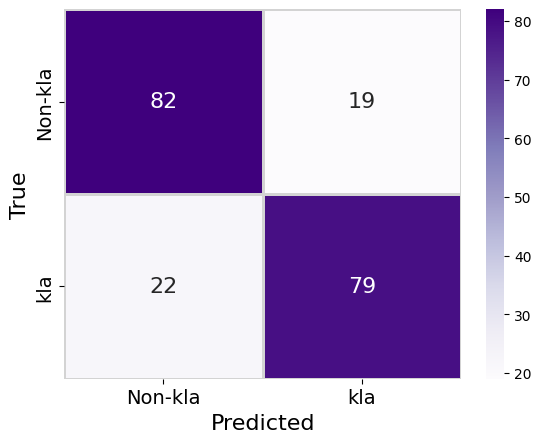

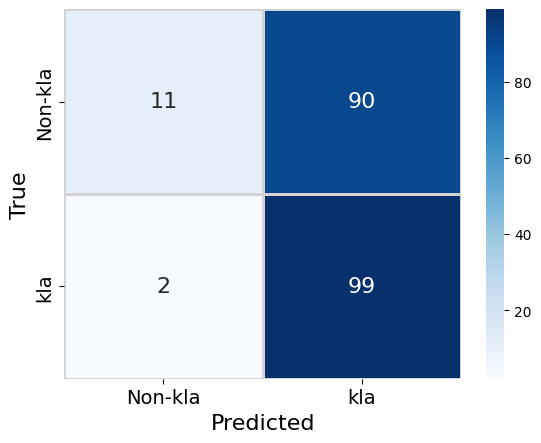

In [29]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import matplotlib.patheffects as path_effects
from sklearn.metrics import roc_curve, auc, precision_recall_curve
ratio = '1'
pdict = {'kac':'Acetylation', 'kcr':'Crotonylation', 'kmal':'Malonylation', 'ksucc':'Succinylation', 'khib':'2-Hydroxyisobutyrylation', 'kla':'Lactylation'}

for ptm in ['kac', 'kcr', 'kmal', 'ksucc', 'khib', 'kla']:
    my_result = f'/home/zhqin/project/2024/01.SLAM/RicePTM_result/ratio_{ratio}_transfer/SLAM_seq/{ptm}_logits_results.txt'
    iriceMS_result = f'/home/zhqin/project/2024/01.SLAM/RicePTM/feature_extraction/{ptm}_ratio_{ratio}_fusion.csv'
    df1 = pd.read_csv(my_result, sep='\t')
    df2 = pd.read_csv(iriceMS_result, sep=',')
    plt.figure(figsize=(7, 7))
    # ROC Curve for iRice-MS
    y_true = df2['Label']
    y_scores = df2['Pred']
    fpr, tpr, _ = roc_curve(y_true, y_scores)
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, color='#F0A8D0', lw=2.5, label=f'iRice-MS: {roc_auc:.3f}')
    plt.fill_between(fpr, tpr, alpha=0.05, color='#F0A8D0')  # 填充曲线下方区域
    # ROC Curve for SLAM_rice
    y_true = df1['Label']
    y_scores = df1['Logit']
    fpr, tpr, _ = roc_curve(y_true, y_scores)
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, color='#5755FE', lw=2.5, label=f'SLAM_rice: {roc_auc:.3f}')
    plt.fill_between(fpr, tpr, alpha=0.05, color='#5755FE')  # 填充曲线下方区域
    # Random classifier
    fpr_random = np.linspace(0, 1, 100)
    tpr_random = fpr_random
    plt.plot(fpr_random, tpr_random, color='#686D76', linestyle='--', lw=2.5, label='Random')
    
    # Labels and Title
    plt.title(f'{pdict[ptm]}', fontsize=18, pad=15)
    plt.xlabel('False Positive Rate', fontsize=16)
    plt.ylabel('True Positive Rate', fontsize=16)
    plt.legend(loc='lower right', fontsize=14)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.grid(alpha=0.3)
    plt.savefig(f'plot/perf/{ratio}_{ptm}_auroc.png', dpi=600)

    # Precision-Recall Curve
    precision1, recall1, _ = precision_recall_curve(df1['Label'], df1['Logit'])
    auprc1 = auc(recall1, precision1)

    precision2, recall2, _ = precision_recall_curve(df2['Label'], df2['Pred'])
    auprc2 = auc(recall2, precision2)

    plt.figure(figsize=(7, 7))
    plt.plot(recall2, precision2, color='#F0A8D0', lw=2.5, label=f'iRice-MS = {auprc2:.3f}')
    plt.fill_between(recall2, precision2, alpha=0.05, color='#F0A8D0')  # 填充曲线下方区域
    plt.plot(recall1, precision1, color='#5755FE', lw=2.5, label=f'SLAM_rice = {auprc1:.3f}')
    plt.fill_between(recall1, precision1, alpha=0.05, color='#5755FE')  # 填充曲线下方区域
    
    plt.title(f'{pdict[ptm]}', fontsize=18,pad=15)
    plt.xlabel('Recall', fontsize=16)
    plt.ylabel('Precision', fontsize=16)
    plt.legend(loc='lower left', fontsize=14)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.grid(alpha=0.3)
    plt.savefig(f'plot/perf/{ratio}_{ptm}_auprc.png', dpi=600)

    # Confusion Matrices
    acc_, th_, rec_, pre_, f1_, spe_, mcc_, auc_, pred_class, auprc_, tn, fp, fn, tp = eval_metrics(df1['Logit'].to_numpy(), df1['Label'].to_numpy())
    cm1 = np.array([[tn, fp], [fn, tp]])

    acc_, th_, rec_, pre_, f1_, spe_, mcc_, auc_, pred_class, auprc_, tn, fp, fn, tp = eval_metrics(df2['Pred'].to_numpy(), df2['Label'].to_numpy())
    cm2 = np.array([[tn, fp], [fn, tp]])

    def plot_confusion_matrix(cm, title, filename, cmap):
        plt.figure()
        ax = sns.heatmap(cm, annot=True, fmt='d', cmap=cmap, cbar=True, 
                         xticklabels=[f'Non-{ptm}', f'{ptm}'], 
                         yticklabels=[f'Non-{ptm}', f'{ptm}'],
                         linewidths=1, linecolor='lightgray', annot_kws={"size": 16})
        plt.xlabel('Predicted', fontsize=16)
        plt.ylabel('True', fontsize=16)
        plt.xticks(fontsize=14)
        plt.yticks(fontsize=14)

        plt.savefig(filename, dpi=600)

    # Plot Confusion Matrices
    plot_confusion_matrix(cm1, f'Confusion Matrix for SLAM_rice', f'plot/perf/{ratio}_{ptm}_slam_rice_cm.png', 'Purples')
    plot_confusion_matrix(cm2, f'Confusion Matrix for iRice-MS', f'plot/perf/{ratio}_{ptm}_irice_ms_cm.png', 'Blues')


/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/ipykernel_launcher.py:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


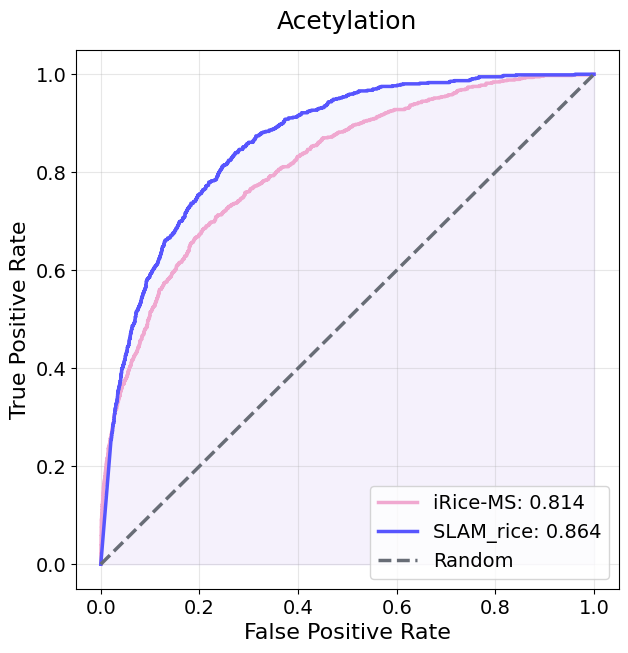

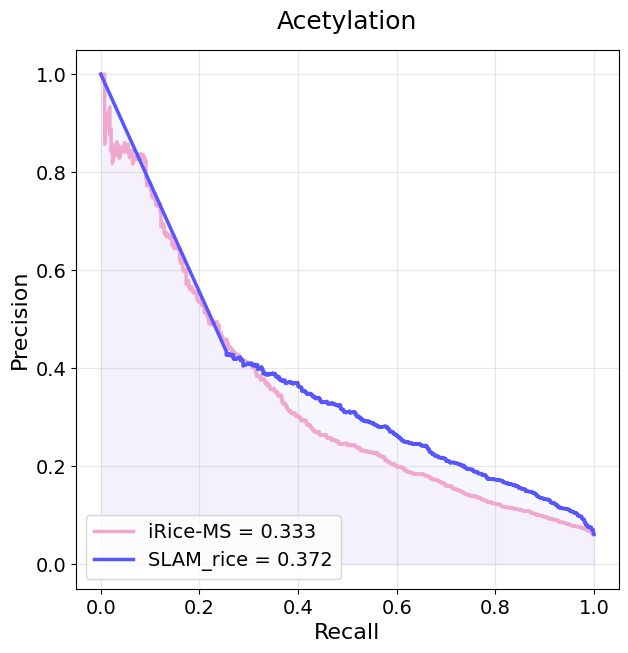

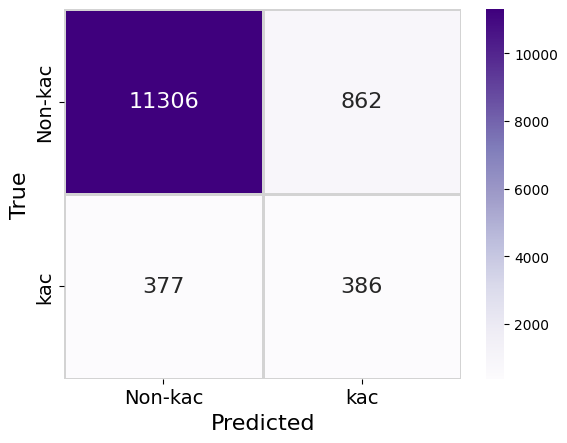

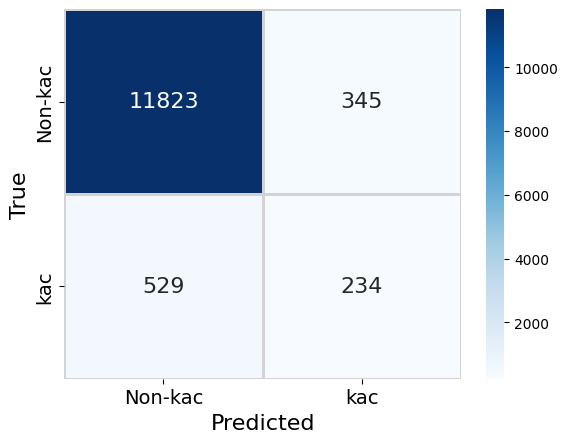

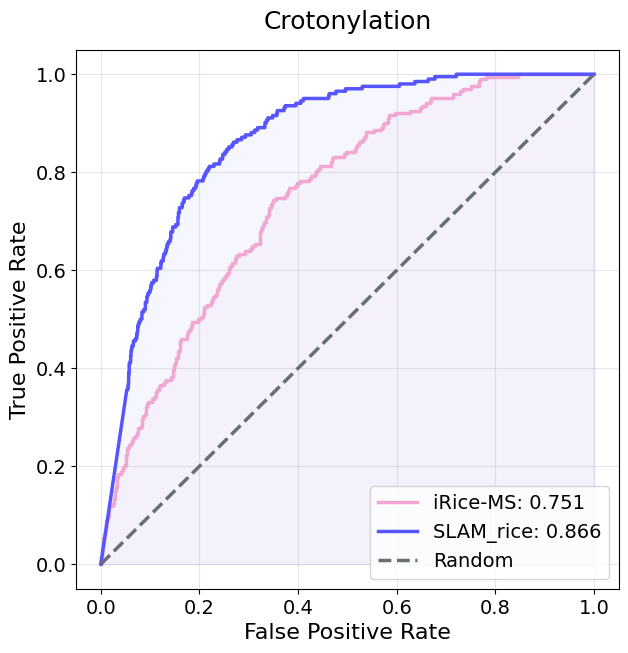

...

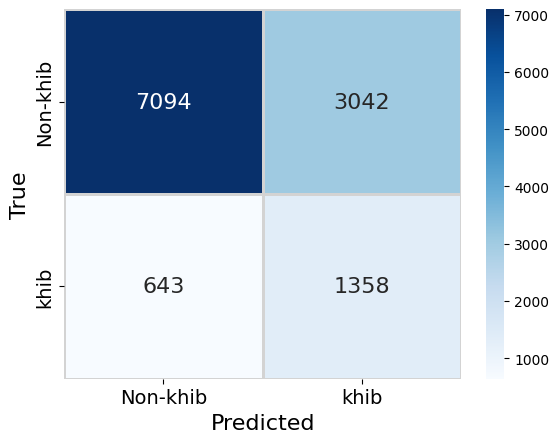

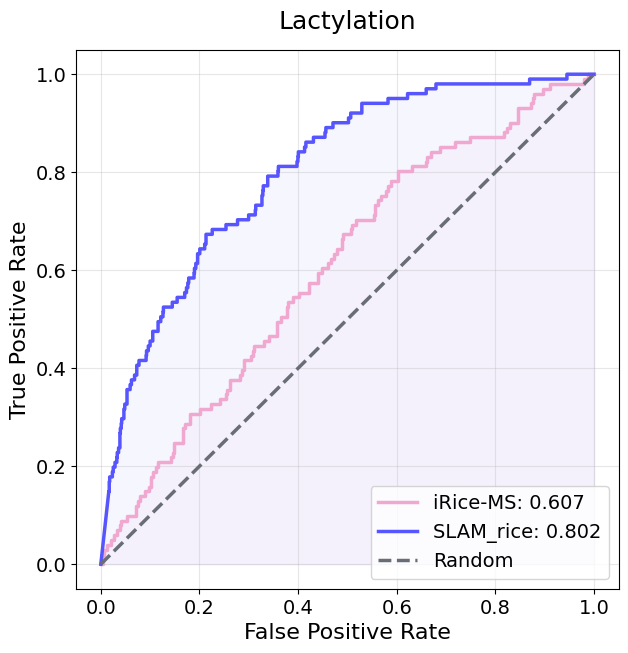

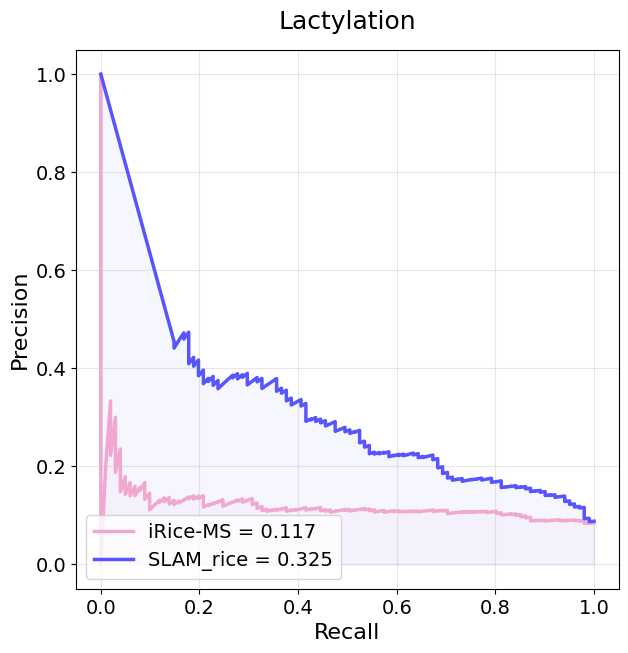

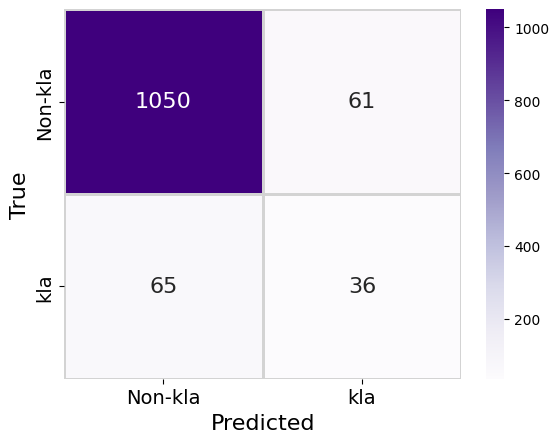

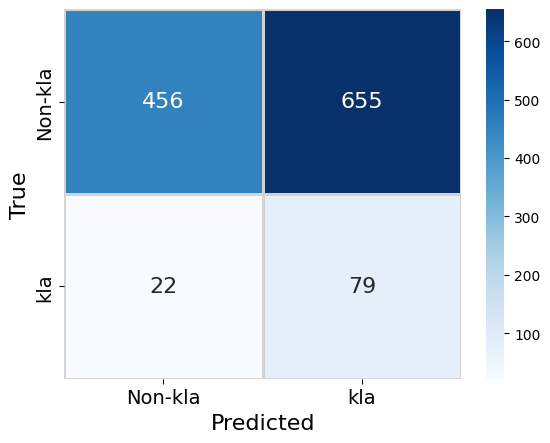

In [28]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import matplotlib.patheffects as path_effects
from sklearn.metrics import roc_curve, auc, precision_recall_curve

ratio = 'all'
pdict = {'kac':'Acetylation', 'kcr':'Crotonylation', 'kmal':'Malonylation', 'ksucc':'Succinylation', 'khib':'2-Hydroxyisobutyrylation', 'kla':'Lactylation'}

for ptm in ['kac', 'kcr', 'kmal', 'ksucc', 'khib', 'kla']:
    my_result = f'/home/zhqin/project/2024/01.SLAM/RicePTM_result/ratio_{ratio}_transfer/SLAM_seq/{ptm}_logits_results.txt'
    iriceMS_result = f'/home/zhqin/project/2024/01.SLAM/RicePTM/feature_extraction/{ptm}_ratio_{ratio}_fusion.csv'
    df1 = pd.read_csv(my_result, sep='\t')
    df2 = pd.read_csv(iriceMS_result, sep=',')
    plt.figure(figsize=(7, 7))
    # ROC Curve for iRice-MS
    y_true = df2['Label']
    y_scores = df2['Pred']
    fpr, tpr, _ = roc_curve(y_true, y_scores)
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, color='#F0A8D0', lw=2.5, label=f'iRice-MS: {roc_auc:.3f}')
    plt.fill_between(fpr, tpr, alpha=0.05, color='#F0A8D0')  # 填充曲线下方区域
    # ROC Curve for SLAM_rice
    y_true = df1['Label']
    y_scores = df1['Logit']
    fpr, tpr, _ = roc_curve(y_true, y_scores)
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, color='#5755FE', lw=2.5, label=f'SLAM_rice: {roc_auc:.3f}')
    plt.fill_between(fpr, tpr, alpha=0.05, color='#5755FE')  # 填充曲线下方区域
    # Random classifier
    fpr_random = np.linspace(0, 1, 100)
    tpr_random = fpr_random
    plt.plot(fpr_random, tpr_random, color='#686D76', linestyle='--', lw=2.5, label='Random')
    
    # Labels and Title
    plt.title(f'{pdict[ptm]}', fontsize=18, pad=15)
    plt.xlabel('False Positive Rate', fontsize=16)
    plt.ylabel('True Positive Rate', fontsize=16)
    plt.legend(loc='lower right', fontsize=14)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.grid(alpha=0.3)
    plt.savefig(f'plot/perf/{ratio}_{ptm}_auroc.png', dpi=600)

    # Precision-Recall Curve
    precision1, recall1, _ = precision_recall_curve(df1['Label'], df1['Logit'])
    auprc1 = auc(recall1, precision1)

    precision2, recall2, _ = precision_recall_curve(df2['Label'], df2['Pred'])
    auprc2 = auc(recall2, precision2)

    plt.figure(figsize=(7, 7))
    plt.plot(recall2, precision2, color='#F0A8D0', lw=2.5, label=f'iRice-MS = {auprc2:.3f}')
    plt.fill_between(recall2, precision2, alpha=0.05, color='#F0A8D0')  # 填充曲线下方区域
    plt.plot(recall1, precision1, color='#5755FE', lw=2.5, label=f'SLAM_rice = {auprc1:.3f}')
    plt.fill_between(recall1, precision1, alpha=0.05, color='#5755FE')  # 填充曲线下方区域
    
    plt.title(f'{pdict[ptm]}', fontsize=18,pad=15)
    plt.xlabel('Recall', fontsize=16)
    plt.ylabel('Precision', fontsize=16)
    plt.legend(loc='lower left', fontsize=14)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.grid(alpha=0.3)
    plt.savefig(f'plot/perf/{ratio}_{ptm}_auprc.png', dpi=600)

    # Confusion Matrices
    acc_, th_, rec_, pre_, f1_, spe_, mcc_, auc_, pred_class, auprc_, tn, fp, fn, tp = eval_metrics(df1['Logit'].to_numpy(), df1['Label'].to_numpy())
    cm1 = np.array([[tn, fp], [fn, tp]])

    acc_, th_, rec_, pre_, f1_, spe_, mcc_, auc_, pred_class, auprc_, tn, fp, fn, tp = eval_metrics(df2['Pred'].to_numpy(), df2['Label'].to_numpy())
    cm2 = np.array([[tn, fp], [fn, tp]])

    def plot_confusion_matrix(cm, title, filename, cmap):
        plt.figure()
        ax = sns.heatmap(cm, annot=True, fmt='d', cmap=cmap, cbar=True, 
                         xticklabels=[f'Non-{ptm}', f'{ptm}'], 
                         yticklabels=[f'Non-{ptm}', f'{ptm}'],
                         linewidths=1, linecolor='lightgray', annot_kws={"size": 16})
        plt.xlabel('Predicted', fontsize=16)
        plt.ylabel('True', fontsize=16)
        plt.xticks(fontsize=14)
        plt.yticks(fontsize=14)

        plt.savefig(filename, dpi=600)

    # Plot Confusion Matrices
    plot_confusion_matrix(cm1, f'Confusion Matrix for SLAM_rice', f'plot/perf/{ratio}_{ptm}_slam_rice_cm.png', 'Purples')
    plot_confusion_matrix(cm2, f'Confusion Matrix for iRice-MS', f'plot/perf/{ratio}_{ptm}_irice_ms_cm.png', 'Blues')


/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


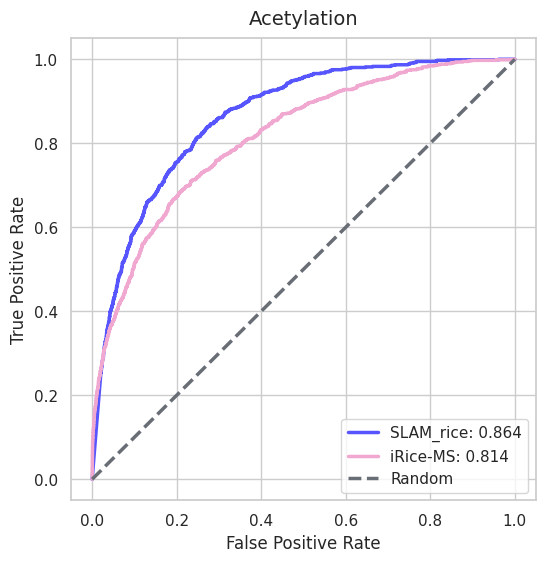

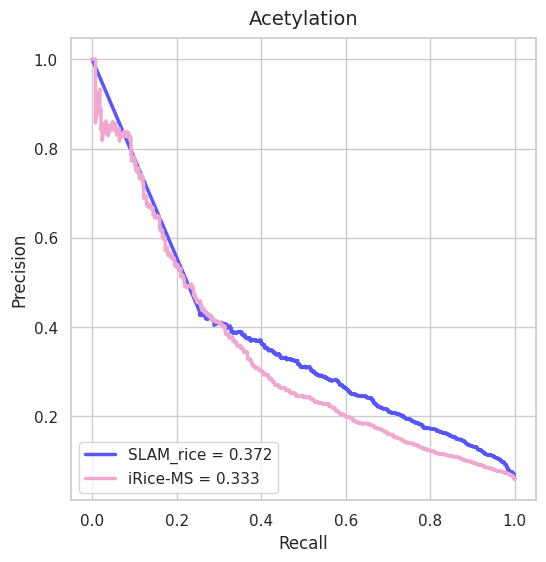

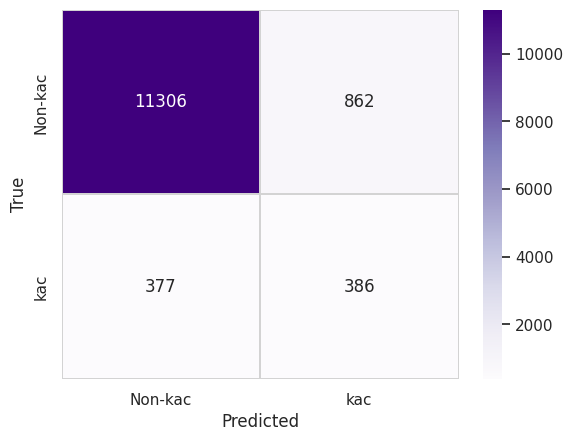

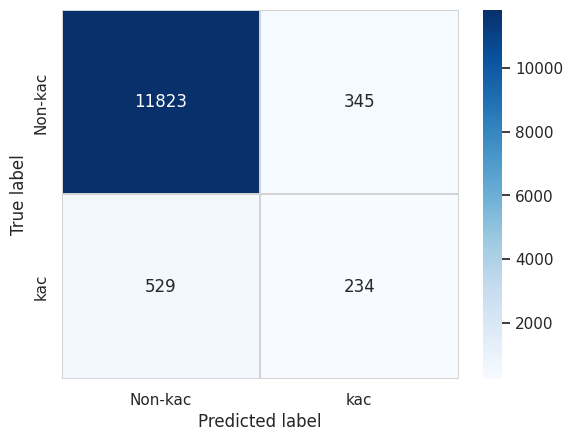

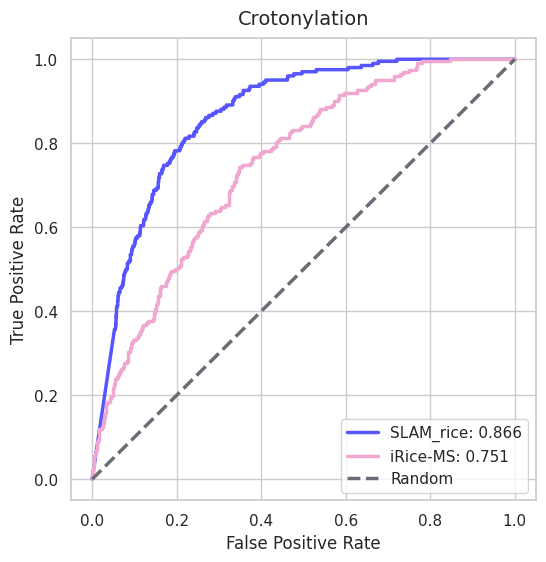

...

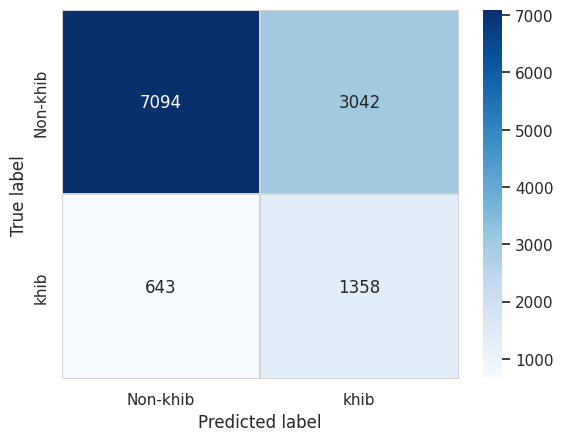

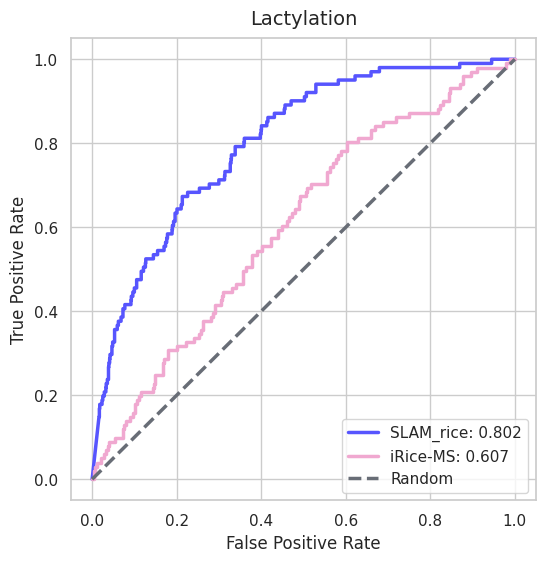

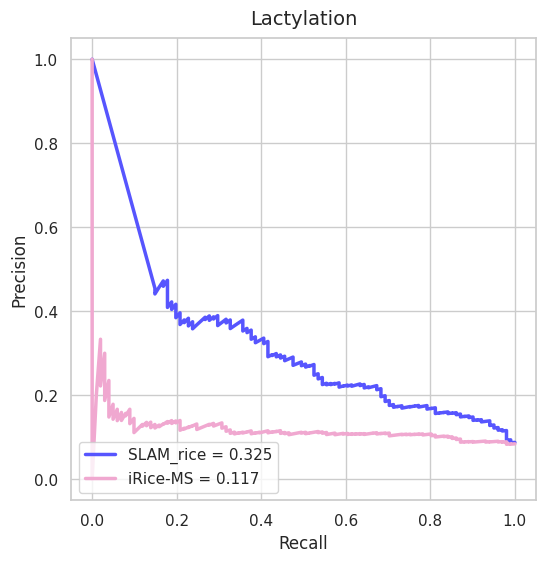

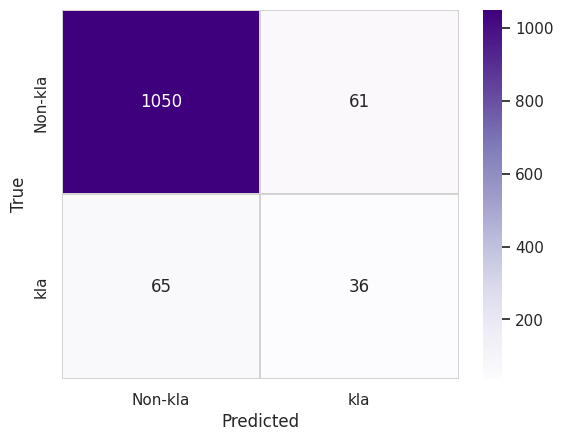

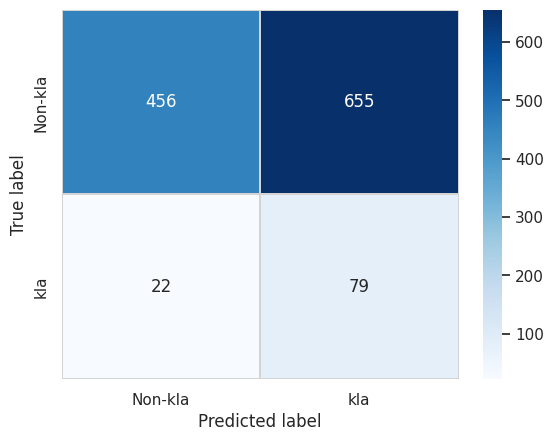

In [835]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc, precision_recall_curve, average_precision_score, confusion_matrix
import seaborn as sns

ratio = 'all'
pdict = {'kac':'Acetylation', 'kcr':'Crotonylation', 'kmal':'Malonylation', 'ksucc':'Succinylation', 'khib':'2-Hydroxyisobutyrylation', 'kla':'Lactylation'}

for ptm in ['kac', 'kcr', 'kmal', 'ksucc', 'khib', 'kla']:
    my_result = f'/home/zhqin/project/2024/01.SLAM/RicePTM_result/ratio_{ratio}_transfer/SLAM_seq/{ptm}_logits_results.txt'
    iriceMS_result = f'/home/zhqin/project/2024/01.SLAM/RicePTM/feature_extraction/{ptm}_ratio_{ratio}_fusion.csv'
    df1 = pd.read_csv(my_result, sep='\t')
    df2 = pd.read_csv(iriceMS_result, sep=',')
    
    # ROC Curve for SLAM_rice
    y_true = df1['Label']
    y_scores = df1['Logit']
    fpr, tpr, _ = roc_curve(y_true, y_scores)
    roc_auc = auc(fpr, tpr)
    
    # Plot ROC for SLAM_rice
    plt.figure(figsize=(6, 6))    
    plt.plot(fpr, tpr, color='#5755FE', lw=2.5, label=f'SLAM_rice: {roc_auc:.3f}')
    
    # ROC Curve for iRice-MS
    y_true = df2['Label']
    y_scores = df2['Pred']
    fpr, tpr, _ = roc_curve(y_true, y_scores)
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, color='#F0A8D0', lw=2.5, label=f'iRice-MS: {roc_auc:.3f}')
    
    # Random classifier ROC Curve (y = x)
    fpr_random = np.linspace(0, 1, 100)
    tpr_random = fpr_random  # Random classifier line: y = x (random guessing)
    roc_auc_random = 0.5  # AUC of 0.5 represents random classification
    plt.plot(fpr_random, tpr_random, color='#686D76', linestyle='--', lw=2.5, label=f'Random')
    
    # Title, labels, and legend for ROC curve
    plt.title(f'{pdict[ptm]}', pad=10, fontsize=14)
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.legend(loc='lower right')
    plt.savefig(f'plot/perf/{ratio}_{ptm}_auroc.png', dpi=600)
    
    # Precision-Recall Curve for SLAM_rice
    precision1, recall1, _ = precision_recall_curve(df1['Label'], df1['Logit'])
    auprc1 = auc(recall1, precision1)

    # Precision-Recall Curve for iRice-MS
    precision2, recall2, _ = precision_recall_curve(df2['Label'], df2['Pred'])
    auprc2 = auc(recall2, precision2)
    # Plot Precision-Recall Curve
    plt.figure(figsize=(6, 6))
    plt.plot(recall1, precision1, color='#5755FE', lw=2.5, label=f'SLAM_rice = {auprc1:.3f}')
    plt.plot(recall2, precision2, color='#F0A8D0', lw=2.5, label=f'iRice-MS = {auprc2:.3f}')
    
    # Title, labels, and legend for PRC
    plt.title(f'{pdict[ptm]}', pad=10, fontsize=14)
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.legend(loc='lower left')
    plt.savefig(f'plot/perf/{ratio}_{ptm}_auprc.png', dpi=600)
    
    # Confusion Matrix for SLAM_rice
    acc_, th_, rec_, pre_, f1_, spe_, mcc_, auc_, pred_class, auprc_, tn, fp, fn, tp = eval_metrics(df1['Logit'].to_numpy(), df1['Label'].to_numpy())
    cm1 = np.array([[tn,fp],[fn,tp]])
    # Confusion Matrix for iRice-MS
    acc_, th_, rec_, pre_, f1_, spe_, mcc_, auc_, pred_class, auprc_, tn, fp, fn, tp = eval_metrics(df2['Pred'].to_numpy(), df2['Label'].to_numpy())
    cm2 = np.array([[tn,fp],[fn,tp]])
    # Plot Confusion Matrix for SLAM_rice
    plt.figure()
    sns.heatmap(cm1, annot=True, fmt='d', cmap='Purples', cbar=True, xticklabels=[f'Non-{ptm}', f'{ptm}'], yticklabels=[f'Non-{ptm}', f'{ptm}'], linewidths=0.1, linecolor='lightgray')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.savefig(f'plot/perf/{ratio}_{ptm}_slam_rice_cm.png', dpi=600)
    
    # Plot Confusion Matrix for iRice-MS
    plt.figure()
    sns.heatmap(cm2, annot=True, fmt='d', cmap='Blues', cbar=True, xticklabels=[f'Non-{ptm}',f'{ptm}', ], yticklabels=[f'Non-{ptm}', f'{ptm}'], linewidths=0.1, linecolor='lightgray')
#     plt.title(f'Confusion Matrix for iRice-MS: {pdict[ptm]}', fontsize=14)
    plt.xlabel('Predicted label')
    plt.ylabel('True label')
    plt.savefig(f'plot/perf/{ratio}_{ptm}_irice_ms_cm.png', dpi=600)


In [38]:
!pwd

/home/zhqin/project/2024/01.SLAM/RicePTM_result


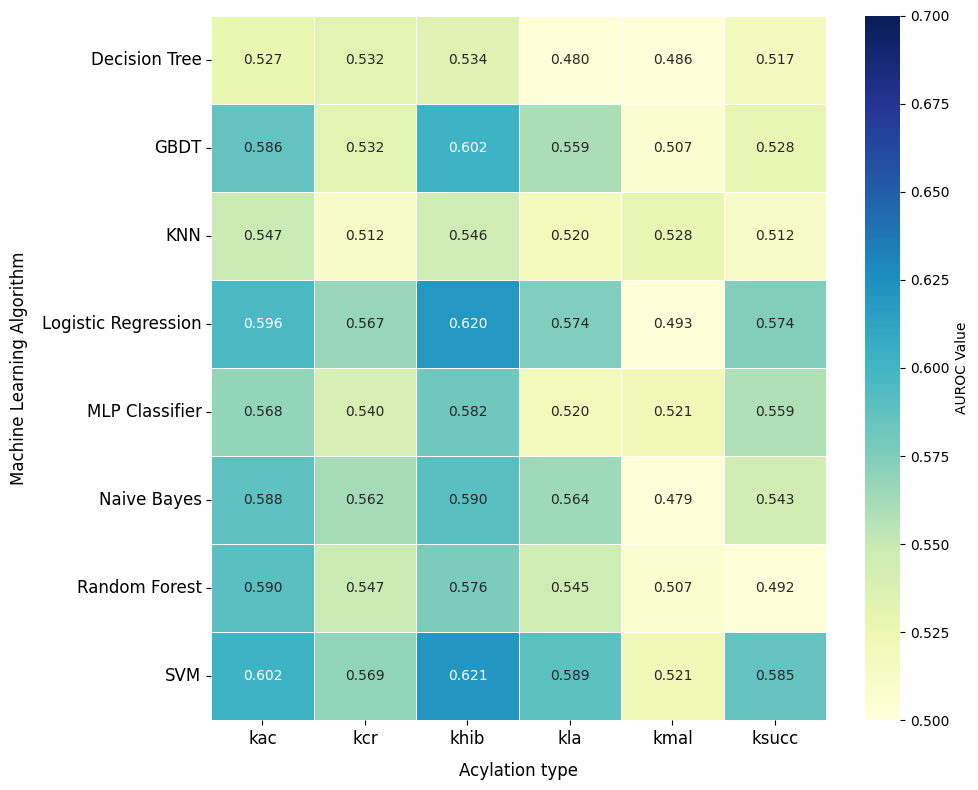

In [30]:
mldf = pd.read_csv('/home/zhqin/project/2024/01.SLAM/RicePTM/feature_extraction/ML_perf_results.csv')
# mldf = pd.read_csv('/home/zhqin/project/2024/01.SLAM/RicePTM/feature_extraction/Feature_ML_ratio_all_perf_results.csv')
# mldf
mldf.columns = ['PTM', 'Algorithm', 'Acc', 'th','Rec/Sn', 'Pre', 'F1', 'Spe', 'MCC', 'AUROC', 'AUPRC', 'TN', 'FP', 'FN', 'TP']
heatmap_data = mldf.pivot(index="Algorithm", columns="PTM", values="AUROC")

# 绘制热图
plt.figure(figsize=(10, 8))
sns.heatmap(
    heatmap_data, 
    annot=True, 
    fmt=".3f", 
    cmap="YlGnBu",
    linewidths=0.5,
    cbar_kws={"label": "AUROC Value"},
    vmin=0.5, 
    vmax=0.7
)

# plt.title("AUROC of ML Algorithms across PTM Datasets", fontsize=14, pad=20)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12, rotation=0)
plt.xlabel("Acylation type", fontsize=12,labelpad=10)
plt.ylabel("Machine Learning Algorithm", fontsize=12,labelpad=10)
plt.tight_layout()
plt.savefig(f'plot/perf/ML_algorithsm_auroc.png',dpi=600)


In [35]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

xgboost_df = pd.read_csv("/home/zhqin/project/2024/01.SLAM/RicePTM/feature_extraction/XGBoost_rice_results.csv",sep=',',header=None)
xgboost_df.columns = ['PTM', 'Algorithm', 'Acc', 'th', 'Rec/Sn', 'Pre', 'F1', 'Spe', 'MCC',
       'AUROC', 'AUPRC', 'TN', 'FP', 'FN', 'TP']
xgboost_df['Algorithm'] = ['XGBoost' for a in range(6)]
xgboost_df

slam_rice_df = pd.read_csv("/home/zhqin/project/2024/01.SLAM/RicePTM_result/ratio1/SLAM_seq/performance.csv",sep='\t')
slam_rice_df.columns = ['PTM', 'Acc',  'Rec/Sn', 'Pre', 'F1', 'Spe', 'MCC', 'AUROC', 'AUPRC', 'TN', 'FP', 'FN', 'TP']
slam_rice_df['Algorithm'] = 'SLAM_rice'
slam_rice_df['th'] = [0 for a in range(6)]
slam_rice_df
# 将两个DataFrame合并在一起
combined_df = pd.concat([mldf, xgboost_df, slam_rice_df], ignore_index=True)
combined_df['PTM'] = [a.replace('k', 'K') for a in combined_df['PTM'].tolist()]
combined_df['Algorithm'] = [a.replace('MLP Classifier','MLP') for a in combined_df['Algorithm'].tolist()]
combined_df['Algorithm'] = [a.replace('Random Forest','RF') for a in combined_df['Algorithm'].tolist()]
df = combined_df
combined_df.shape

(60, 15)

In [34]:
combined_df

,PTM,Algorithm,Acc,th,Rec/Sn,Pre,F1,Spe,MCC,AUROC,AUPRC,TN,FP,FN,TP
0,Kac,Logistic Regression,0.596330,0.01,0.596330,0.596330,0.596330,0.596330,0.192661,0.596330,0.697248,455,308,308,455
1,Kac,MLP,0.568152,0.01,0.557012,0.569705,0.563287,0.579292,0.136338,0.568152,0.674105,442,321,338,425
2,Kac,RF,0.590433,0.01,0.545216,0.599424,0.571036,0.635649,0.181609,0.590433,0.686016,485,278,347,416
3,Kac,SVM,0.602228,0.01,0.566186,0.610169,0.587356,0.638270,0.204989,0.602228,0.696631,487,276,331,432
4,Kac,GBDT,0.585845,0.01,0.588467,0.585398,0.586928,0.583224,0.171693,0.585845,0.689815,445,318,314,449
5,Kac,Decision Tree,0.526868,0.01,0.522936,0.527081,0.525000,0.530799,0.053737,0.526868,0.644274,405,358,364,399
6,Kac,Naive Bayes,0.587811,0.01,0.609436,0.584171,0.596536,0.566186,0.175787,0.587811,0.694445,432,331,298,465
7,Kac,KNN,0.547182,0.01,0.547837,0.547120,0.547479,0.546527,0.094364,0.547182,0.660520,417,346,345,418
8,Kcr,Logistic Regression,0.566832,0.01,0.539604,0.570681,0.554707,0.594059,0.133862,0.566832,0.670241,120,82,93,109
9,Kcr,MLP,0.539604,0.01,0.549505,0.538835,0.544118,0.529703,0.079223,0.539604,0.656794,107,95,91,111


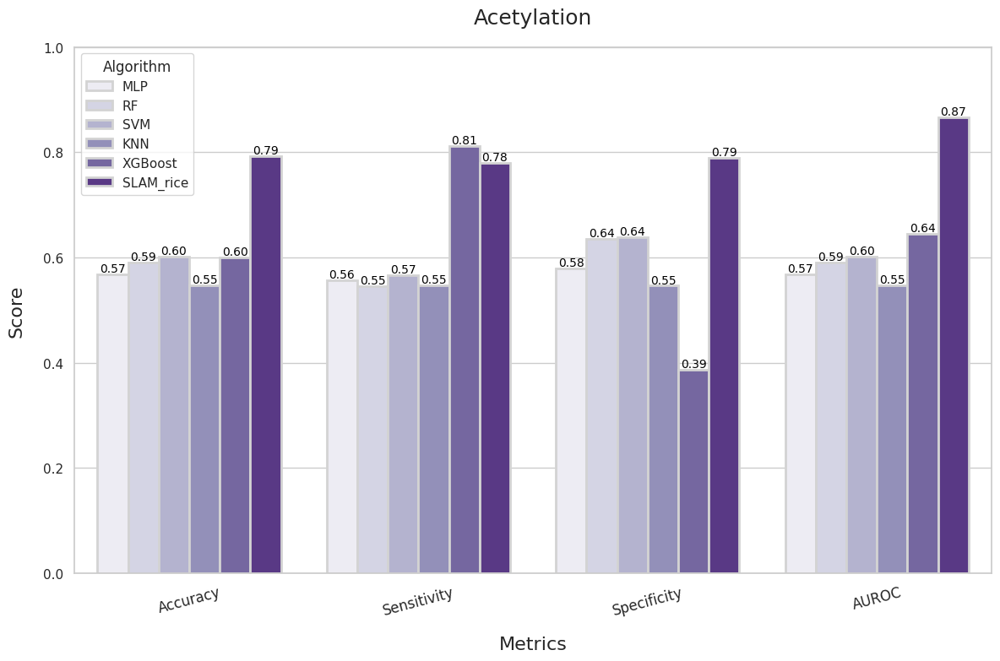

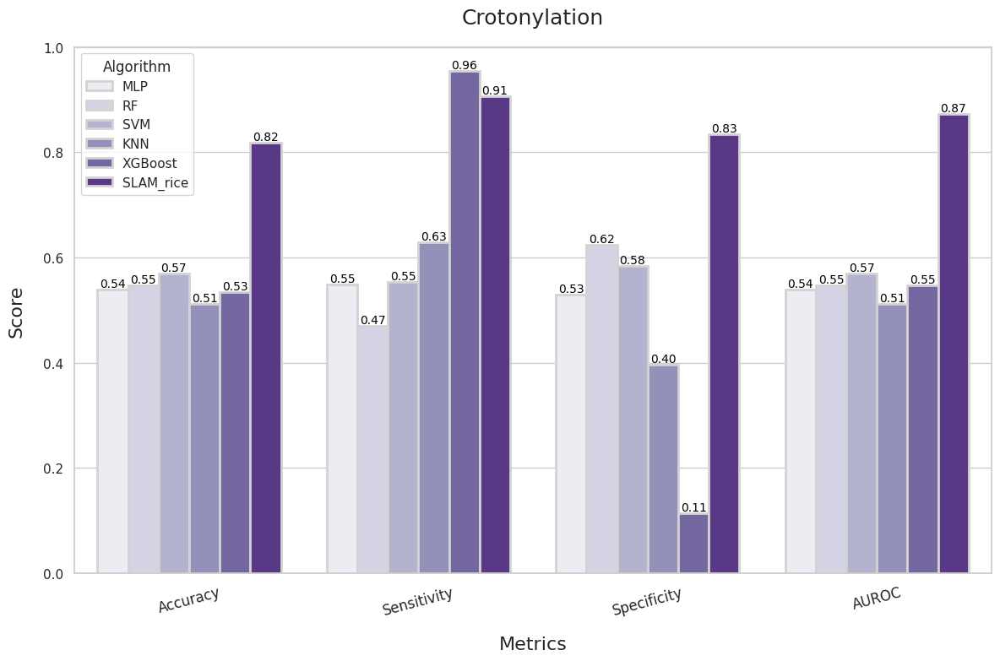

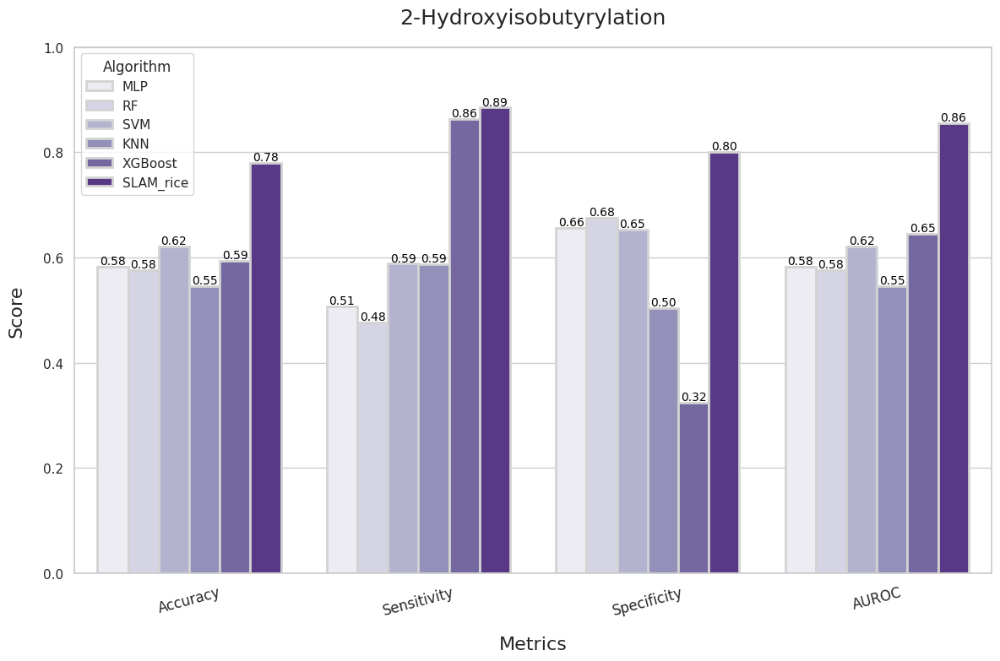

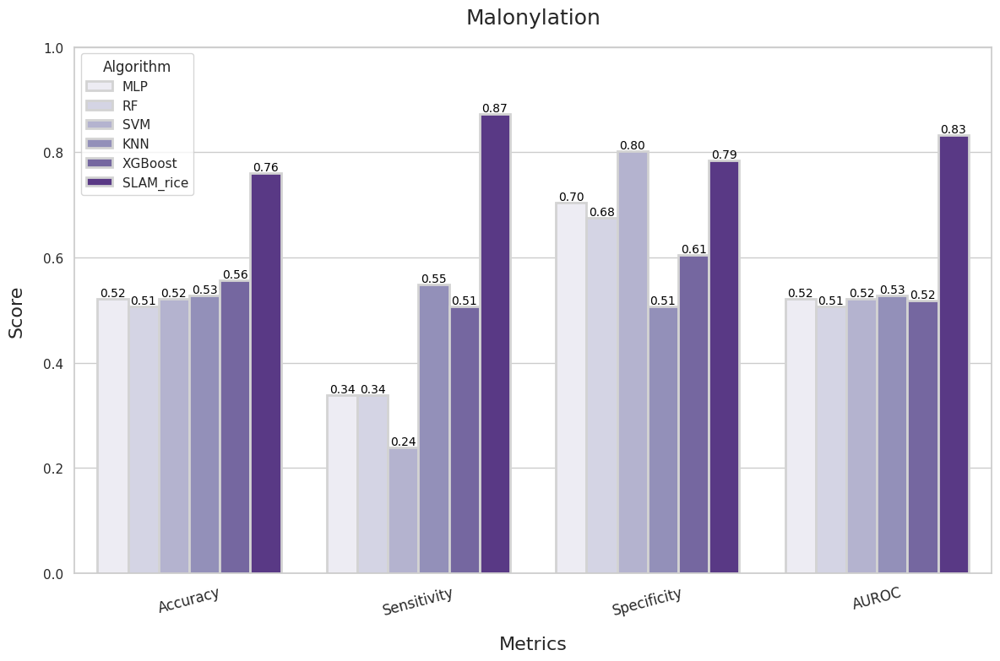

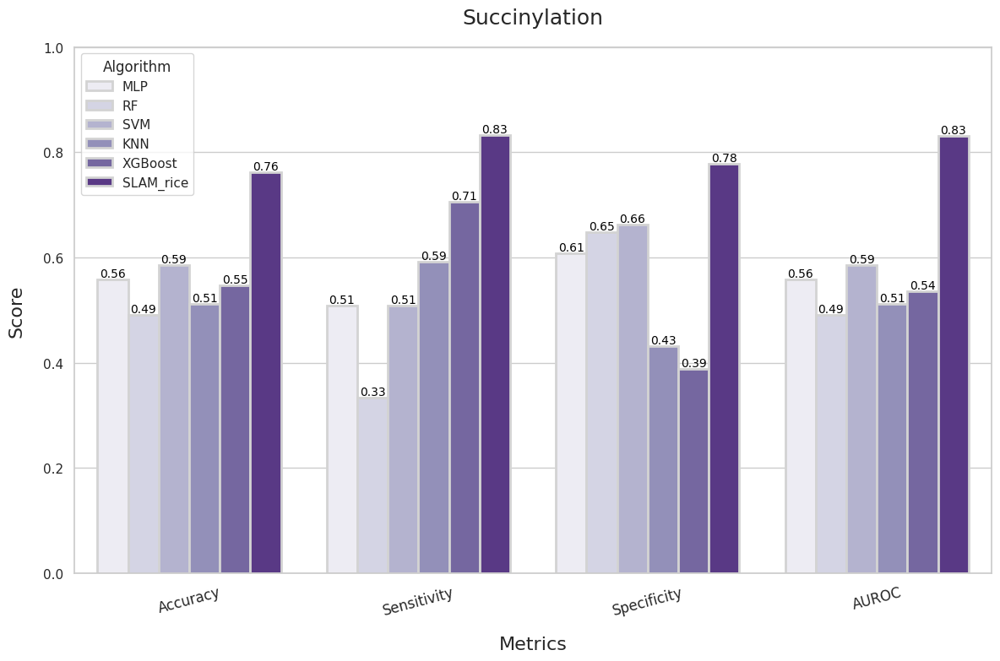

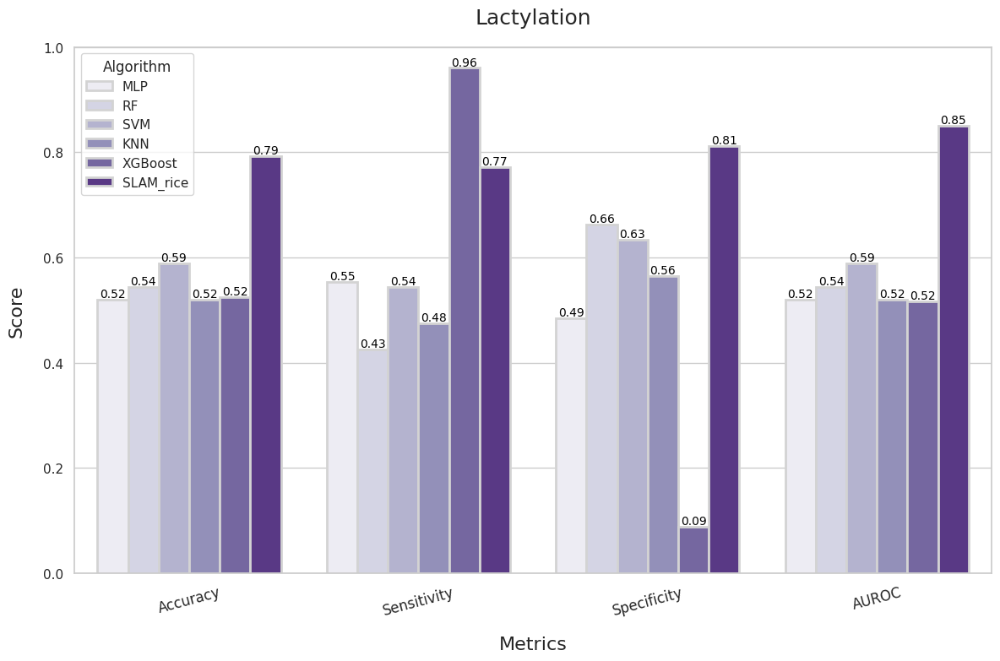

In [37]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

pdict = {'Kac':'Acetylation', 'Kcr':'Crotonylation', 'Kmal':'Malonylation', 
         'Ksucc':'Succinylation', 'Khib':'2-Hydroxyisobutyrylation', 'Kla':'Lactylation'}

# 配置可视化参数
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['axes.labelsize'] = 16
plt.rcParams['axes.titlesize'] = 18
sns.set_theme(style="whitegrid")

# 筛选指定算法和指标
selected_algs = ["MLP", "RF", "SVM", "KNN", "XGBoost", "SLAM_rice"]
selected_metrics = ["Acc", "Rec/Sn", "Spe", "AUROC"]

# 为每个PTM创建可视化
for ptm in df['PTM'].unique():
    # 数据准备
    ptm_data = df[(df['PTM'] == ptm) & 
                   (df['Algorithm'].isin(selected_algs))]
    
    # 转换数据格式
    melted_data = ptm_data.melt(id_vars=['Algorithm'], 
                                  value_vars=selected_metrics,
                                  var_name='Metric', 
                                  value_name='Score')
    
    # 创建画布
    plt.figure(figsize=(12, 8))
    
    # 绘制分组柱状图
    bar = sns.barplot(x='Metric', y='Score', hue='Algorithm', 
                      data=melted_data, palette='Purples',  # 使用更具对比度的调色板
                      edgecolor='lightgrey', linewidth=2)  # 添加柱子边框
    
    # 添加数值标签
    for p in bar.patches:
        height = p.get_height()
        bar.annotate(f'{height:.2f}',
                     (p.get_x() + p.get_width()/2., height),
                     ha='center', va='center', 
                     fontsize=10, color='black',
                     xytext=(0, 5),
                     textcoords='offset points')

    # 美化图形
    plt.title(f'{pdict[ptm]}', fontsize=18, pad=20)
    plt.xlabel('Metrics', fontsize=16, labelpad=15)
    plt.ylabel('Score', fontsize=16, labelpad=15)
    plt.ylim(0, 1)
    
    # 调整X轴标签
    metric_labels = ['Accuracy', 'Sensitivity', 'Specificity', 'AUROC']
    plt.xticks(range(len(selected_metrics)), metric_labels, rotation=15, fontsize=12)
    
    plt.tight_layout()
    plt.savefig(f'plot/perf/{ptm}_comparison_ml.png',dpi=600)


In [312]:
slam_rice_df = pd.read_csv("/home/zhqin/project/2024/01.SLAM/RicePTM_result/ratio1/SLAM_seq/performance.csv",sep='\t')
slam_rice_df.columns = ['PTM', 'Acc',  'Rec/Sn', 'Pre', 'F1', 'Spe', 'MCC', 'AUROC', 'AUPRC', 'TN', 'FP', 'FN', 'TP']
slam_rice_df['Algorithm'] = 'SLAM_rice'
slam_rice_df['th'] = [0 for a in range(6)]
slam_rice_df

,PTM,Acc,Rec/Sn,Pre,F1,Spe,MCC,AUROC,AUPRC,TN,FP,FN,TP,Algorithm,th
0,Kac,0.793,0.780,0.806,0.801,0.790,0.586,0.866,0.864,615,148,168,595,SLAM_rice,0
1,Kcr,0.819,0.906,0.733,0.772,0.834,0.648,0.873,0.852,148,54,19,183,SLAM_rice,0
2,Khib,0.780,0.885,0.676,0.732,0.801,0.573,0.856,0.829,1353,648,231,1770,SLAM_rice,0
3,Kmal,0.761,0.873,0.648,0.713,0.785,0.535,0.833,0.814,46,25,9,62,SLAM_rice,0
4,Ksucc,0.763,0.833,0.692,0.730,0.778,0.530,0.832,0.800,207,92,50,249,SLAM_rice,0
5,Kla,0.792,0.772,0.804,0.788,0.812,0.585,0.850,0.852,82,19,23,78,SLAM_rice,0


In [318]:
slam_all_df = pd.read_csv("/home/zhqin/project/2024/01.SLAM/RicePTM_result/ratio_all/SLAM_seq/final_performance.csv",sep='\t')
slam_all_df.columns = ['PTM', 'Strategy','Acc',  'th', 'Rec/Sn', 'Pre', 'F1', 'Spe', 'MCC', 'AUROC', 'AUPRC', 'TN', 'FP', 'FN', 'TP']
slam_all_df['Algorithm'] = 'Fine-tuned'
slam_all_df

,PTM,Strategy,Acc,th,Rec/Sn,Pre,F1,Spe,MCC,AUROC,AUPRC,TN,FP,FN,TP,Algorithm
0,kac,85,0.918413,0.21,0.450852,0.351020,0.394722,0.947732,0.354876,0.867966,0.400559,11532,636,419,344,Fine-tuned
1,kcr,101,0.855132,0.15,0.648515,0.271784,0.383041,0.870527,0.354836,0.863394,0.389534,2360,351,71,131,Fine-tuned
2,khib,152,0.753152,0.20,0.715642,0.371081,0.488737,0.760556,0.379442,0.818876,0.482973,7709,2427,569,1432,Fine-tuned
3,kmal,98,0.901435,0.20,0.408451,0.322222,0.360248,0.937372,0.310198,0.805861,0.302702,913,61,42,29,Fine-tuned
4,kla,155,0.820957,0.14,0.574257,0.250000,0.348348,0.843384,0.293403,0.801036,0.351930,937,174,43,58,Fine-tuned


In [39]:
ratio1_transfer = pd.read_csv('ratio_1_transfer/SLAM_seq/final_performance_kac,kcr,khib,kmal,ksucc,kla_SLAM_seq.csv',sep='\t')
ratio1_transfer

,PTM,Epoch,Acc,th,Rec/Sn,Pre,F1,Spe,MCC,AUROC,AUPRC,TN,FP,FN,TP
0,kac,56,0.795544,0.48,0.825688,0.778739,0.801527,0.765400,0.592165,0.870089,0.859796,584,179,133,630
1,kcr,14,0.819307,0.35,0.945545,0.754941,0.839560,0.693069,0.659996,0.888026,0.874362,140,62,11,191
2,khib,0,0.776862,0.40,0.875562,0.731219,0.796907,0.678161,0.564838,0.851359,0.825482,1357,644,249,1752
3,kmal,34,0.711268,0.18,0.971831,0.638889,0.770950,0.450704,0.495074,0.805991,0.804092,32,39,2,69
4,ksucc,0,0.757525,0.47,0.849498,0.717514,0.777948,0.665552,0.523991,0.829912,0.802668,199,100,45,254
5,kla,9,0.797030,0.58,0.782178,0.806122,0.793970,0.811881,0.594322,0.845309,0.848519,82,19,22,79


In [40]:
ratio1_no_transfer = pd.read_csv('ratio_1_no_transfer/SLAM_seq/final_performance_kac,kcr,khib,kmal,ksucc,kla_SLAM_seq.csv',sep='\t')
ratio1_no_transfer

,PTM,Epoch,Acc,th,Rec/Sn,Pre,F1,Spe,MCC,AUROC,AUPRC,TN,FP,FN,TP
0,kac,295,0.751638,0.40,0.752294,0.751309,0.751801,0.750983,0.503277,0.823457,0.820960,573,190,189,574
1,kcr,218,0.678218,0.43,0.801980,0.642857,0.713656,0.554455,0.367884,0.730835,0.702614,112,90,40,162
2,khib,170,0.743878,0.42,0.810095,0.715357,0.759784,0.677661,0.492091,0.811132,0.770245,1356,645,380,1621
3,kmal,261,0.725352,0.41,0.774648,0.705128,0.738255,0.676056,0.452911,0.743602,0.781254,48,23,16,55
4,ksucc,273,0.618729,0.54,0.578595,0.629091,0.602787,0.658863,0.238227,0.637364,0.619102,197,102,126,173
5,kla,32,0.509901,0.57,1.000000,0.505000,0.671096,0.019802,0.100000,0.592491,0.554971,2,99,0,101


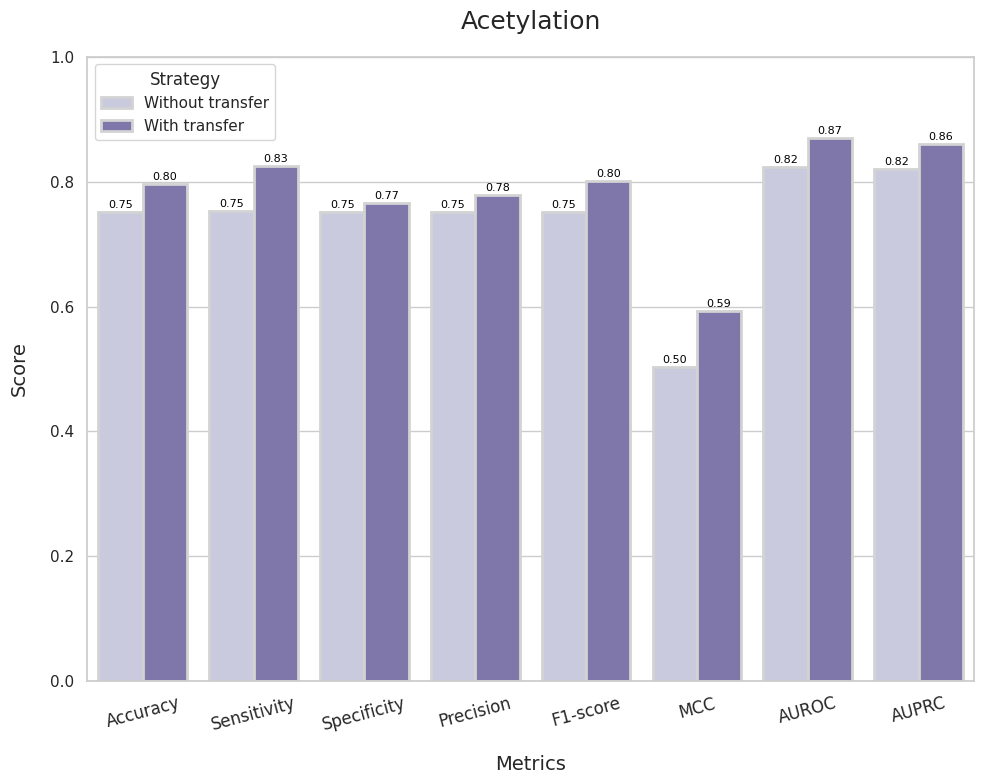

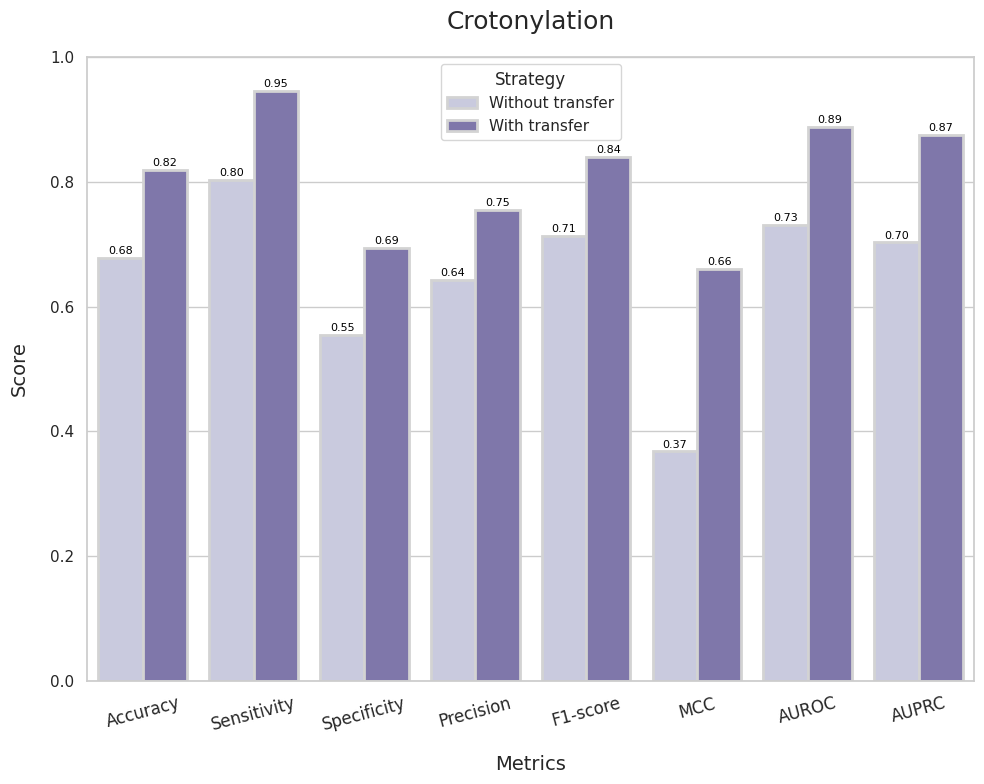

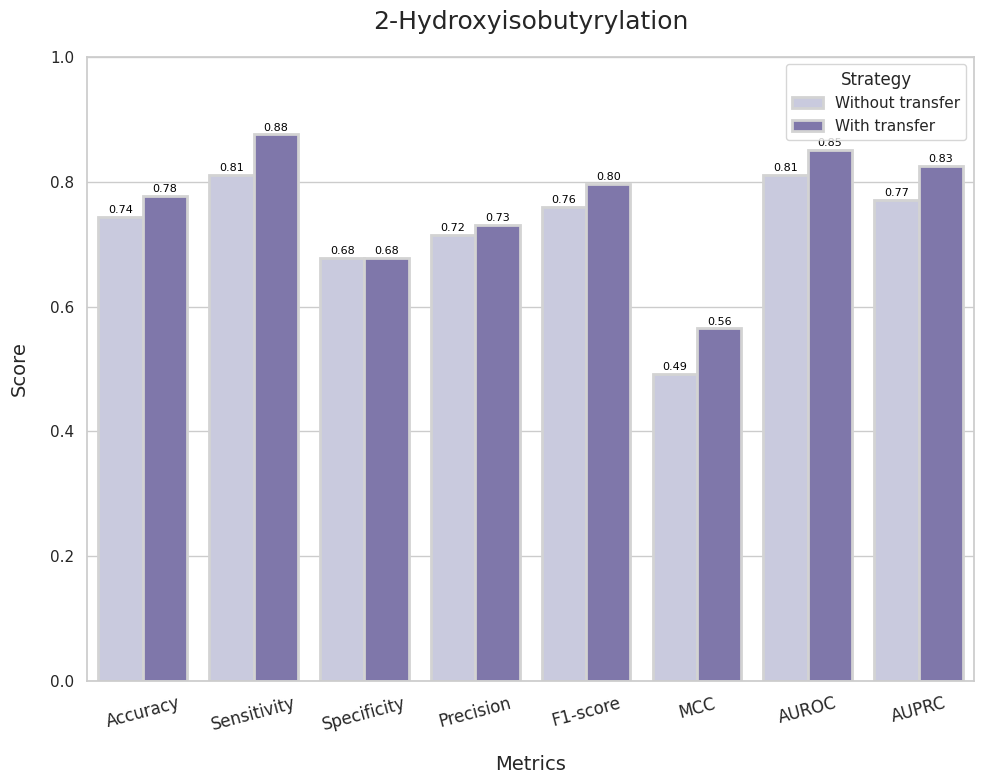

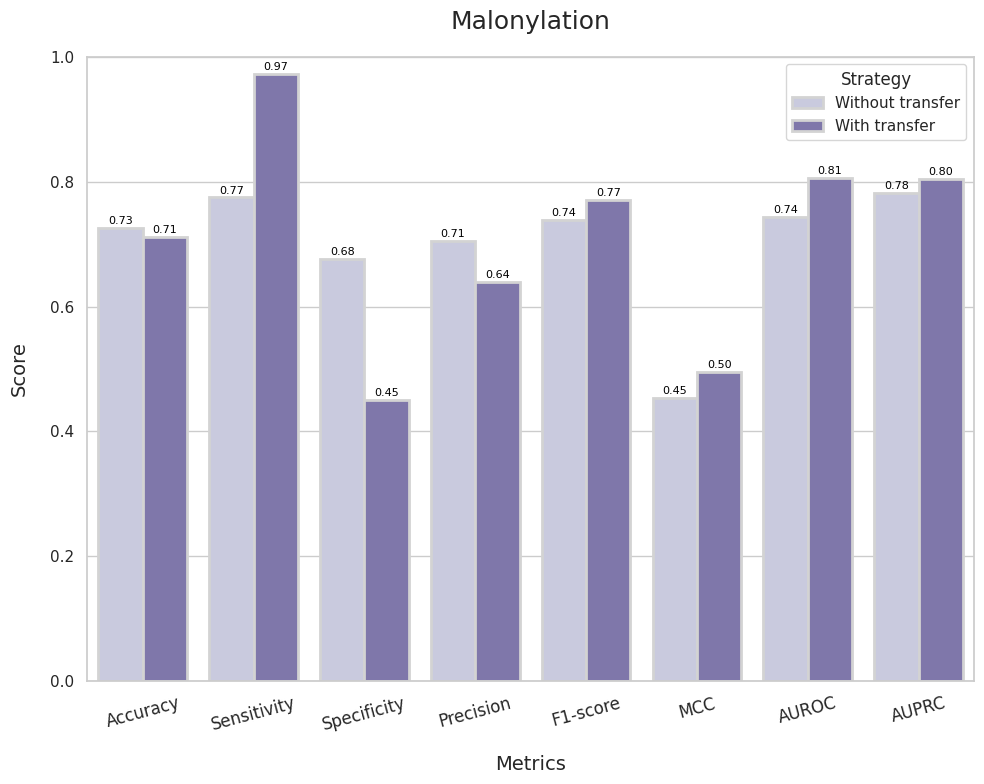

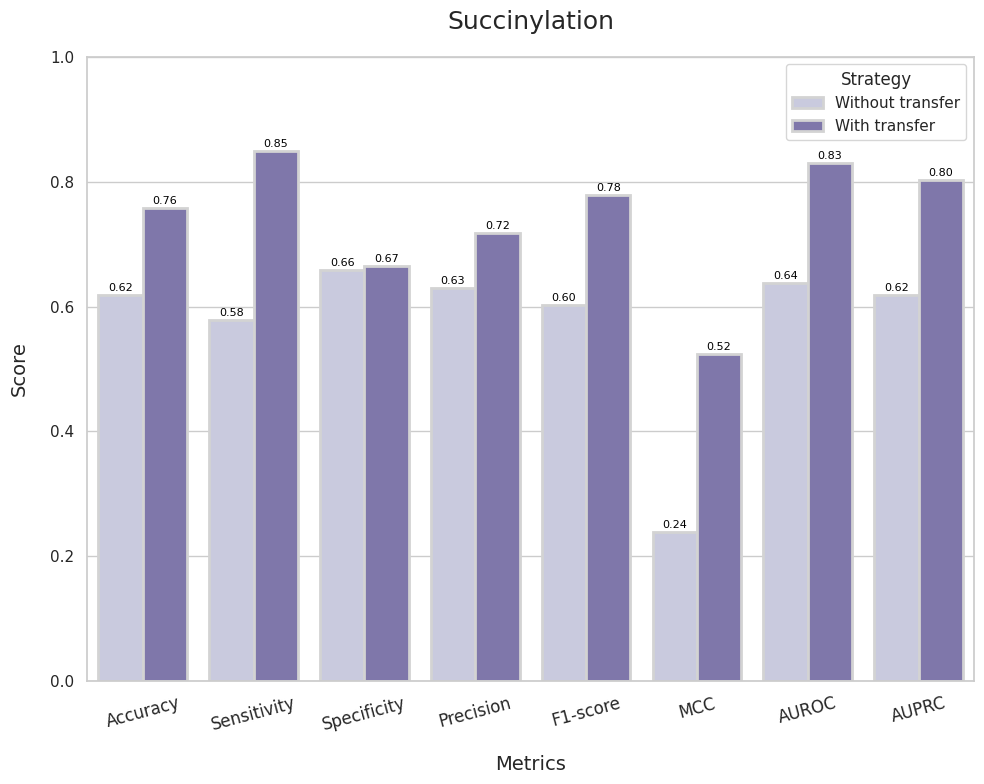

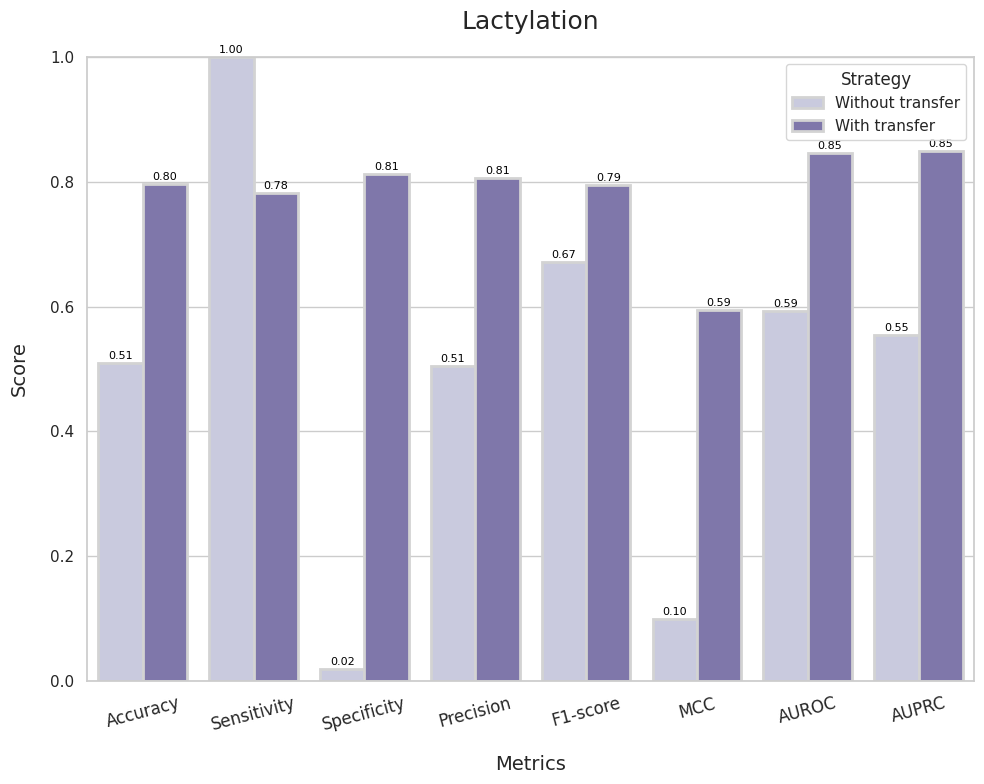

In [45]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 假设 ratio1_no_transfer 和 ratio1_transfer 已经赋值给 df1 和 df2
df1 = ratio1_no_transfer.copy()
df2 = ratio1_transfer.copy()

# 将指标名称存储在字典中
pdict = {'Kac':'Acetylation', 'Kcr':'Crotonylation', 'Kmal':'Malonylation', 
         'Ksucc':'Succinylation', 'Khib':'2-Hydroxyisobutyrylation', 'Kla':'Lactylation'}

# 配置可视化参数
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['axes.labelsize'] = 16
plt.rcParams['axes.titlesize'] = 18
sns.set_theme(style="whitegrid")

# 指定绘制的指标
metrics = ['Acc', 'Rec/Sn', 'Spe', 'Pre', 'F1', 'MCC', 'AUROC', 'AUPRC']

# 为每个PTM绘制图形
for ptm in df1['PTM'].unique():
    # 获取迁移前后的数据
    df1_ptm = df1[df1['PTM'] == ptm]
    df2_ptm = df2[df2['PTM'] == ptm]
    
    # 创建数据框，包含迁移前后的指标
    melted_data = pd.DataFrame({
        'Metric': metrics * 2,
        'Score': list(df1_ptm[metrics].values.flatten()) + list(df2_ptm[metrics].values.flatten()),
        'Strategy': ['Without transfer'] * len(metrics) + ['With transfer'] * len(metrics),
        'PTM': [pdict[ptm.replace('k','K')]] * len(metrics) * 2
    })
    
    # 创建画布
    plt.figure(figsize=(10, 8))
    
    # 绘制分组柱状图
    bar = sns.barplot(x='Metric', y='Score', hue='Strategy', data=melted_data, palette='Purples', 
                      edgecolor='lightgrey', linewidth=2)  # 添加柱子边框
    
    # 添加数值标签
    for p in bar.patches:
        height = p.get_height()
        bar.annotate(f'{height:.2f}', 
                     (p.get_x() + p.get_width()/2., height), 
                     ha='center', va='center', 
                     fontsize=8, color='black', 
                     xytext=(0, 5), 
                     textcoords='offset points')

    # 美化图形
    ptm = ptm.replace('k','K')
    plt.title(f'{pdict[ptm]}', fontsize=18, pad=20)
    plt.xlabel('Metrics', fontsize=14, labelpad=15)
    plt.ylabel('Score', fontsize=14, labelpad=15)
    plt.ylim(0, 1)
    
    # 调整X轴标签
    metric_labels = ['Accuracy', 'Sensitivity', 'Specificity', 'Precision', 'F1-score', 'MCC', 'AUROC', 'AUPRC']
    plt.xticks(range(len(metrics)), metric_labels, rotation=15, fontsize=12)
    
    plt.tight_layout()
    # 保存图形为PNG格式
    plt.savefig(f'plot/perf/{ptm}_comparison_transfer.png', dpi=300)
#     plt.show()


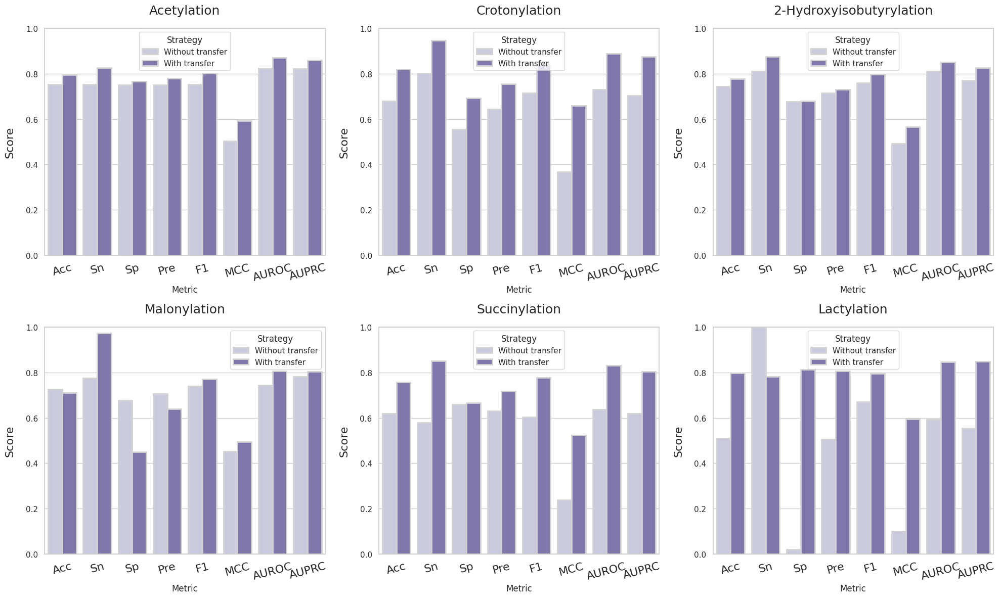

In [50]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 假设 ratio1_no_transfer 和 ratio1_transfer 已经赋值给 df1 和 df2
df1 = ratio1_no_transfer.copy()
df2 = ratio1_transfer.copy()

# 将指标名称存储在字典中
pdict = {'Kac':'Acetylation', 'Kcr':'Crotonylation', 'Kmal':'Malonylation', 
         'Ksucc':'Succinylation', 'Khib':'2-Hydroxyisobutyrylation', 'Kla':'Lactylation'}

# 配置可视化参数
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['axes.labelsize'] = 16
plt.rcParams['axes.titlesize'] = 18
sns.set_theme(style="whitegrid")

# 指定绘制的指标
metrics = ['Acc', 'Rec/Sn', 'Spe', 'Pre', 'F1', 'MCC', 'AUROC', 'AUPRC']

# 创建3x2的子图
fig, axes = plt.subplots(2, 3, figsize=(20, 12))  # 3行2列的子图布局

# 展平axes数组，方便循环访问
axes = axes.flatten()

# 为每个PTM绘制图形
for idx, ptm in enumerate(df1['PTM'].unique()):
    # 获取迁移前后的数据
    df1_ptm = df1[df1['PTM'] == ptm]
    df2_ptm = df2[df2['PTM'] == ptm]
    
    # 创建数据框，包含迁移前后的指标
    melted_data = pd.DataFrame({
        'Metric': metrics * 2,
        'Score': list(df1_ptm[metrics].values.flatten()) + list(df2_ptm[metrics].values.flatten()),
        'Strategy': ['Without transfer'] * len(metrics) + ['With transfer'] * len(metrics),
        'PTM': [pdict[ptm.replace('k','K')]] * len(metrics) * 2
    })
    
    # 获取当前子图的轴
    ax = axes[idx]
    
    # 绘制分组柱状图
    bar = sns.barplot(x='Metric', y='Score', hue='Strategy', data=melted_data, palette='Purples', 
                      ax=ax, edgecolor='lightgrey', linewidth=2)  # 添加柱子边框
    
    # 添加数值标签
#     for p in bar.patches:
#         height = p.get_height()
#         bar.annotate(f'{height:.2f}', 
#                      (p.get_x() + p.get_width()/2., height), 
#                      ha='center', va='center', 
#                      fontsize=10, color='black', 
#                      xytext=(0, 5), 
#                      textcoords='offset points')

    # 美化图形
    ptm = ptm.replace('k','K')
    ax.set_title(f'{pdict[ptm]}', fontsize=18, pad=20)
    ax.set_ylabel('Score', fontsize=16, labelpad=15)
    ax.set_ylim(0, 1)
    
    # 调整X轴标签
    metric_labels = ['Acc', 'Sn', 'Sp', 'Pre', 'F1', 'MCC', 'AUROC', 'AUPRC']
    ax.set_xticks(range(len(metrics)))
    ax.set_xticklabels(metric_labels, rotation=15, fontsize=16)

# 如果某些PTM数量少于6个，填充剩余的空白子图
# for i in range(len(df1['PTM'].unique()), len(axes)):
#     axes[i].axis('off')  # 将空白图关闭，避免显示空白区域

# 调整布局，确保图形不会重叠
plt.tight_layout()

# 如果需要保存图形为PNG格式


# 显示图形
plt.savefig('ratio_1_comparioson_wo_transfer.png', dpi=300)

In [52]:
ratio_all_transfer = pd.read_csv('ratio_all_transfer/SLAM_seq/final_performance_kac,kcr,khib,kmal,ksucc,kla_SLAM_seq.csv',sep='\t')
ratio_all_transfer

,PTM,Epoch,Acc,th,Rec/Sn,Pre,F1,Spe,MCC,AUROC,AUPRC,TN,FP,FN,TP
0,kac,11,0.904184,0.18,0.505898,0.309295,0.383889,0.929158,0.347162,0.863751,0.371798,11306,862,377,386
1,kcr,11,0.822176,0.13,0.747525,0.244337,0.368293,0.827739,0.357455,0.866308,0.398507,2244,467,51,151
2,khib,135,0.776963,0.29,0.650175,0.393289,0.490111,0.801993,0.376806,0.818675,0.466568,8129,2007,700,1301
3,kmal,10,0.867943,0.14,0.549296,0.268966,0.361111,0.891170,0.320639,0.808644,0.254782,868,106,32,39
4,ksucc,1,0.757282,0.16,0.709030,0.314074,0.435318,0.764616,0.350514,0.815842,0.433991,1504,463,87,212
5,kla,22,0.896040,0.22,0.356436,0.371134,0.363636,0.945095,0.307132,0.802354,0.324518,1050,61,65,36


In [53]:
ratio_all_no_transfer = pd.read_csv('ratio_all_no_transfer/SLAM_seq/final_performance_kac,kcr,khib,kmal,ksucc,kla_SLAM_seq.csv',sep='\t')
ratio_all_no_transfer

,PTM,Epoch,Acc,th,Rec/Sn,Pre,F1,Spe,MCC,AUROC,AUPRC,TN,FP,FN,TP
0,kac,492,0.885392,0.15,0.517693,0.261763,0.347711,0.908448,0.312759,0.826484,0.336831,11054,1114,368,395
1,kcr,494,0.762101,0.15,0.623762,0.169583,0.266667,0.772409,0.230887,0.768386,0.184211,2094,617,76,126
2,khib,499,0.718547,0.17,0.778611,0.343853,0.477036,0.706689,0.372299,0.812867,0.418885,7163,2973,443,1558
3,kmal,499,0.931100,0.27,0.070423,0.454545,0.121951,0.993840,0.158456,0.659991,0.134242,968,6,66,5
4,ksucc,499,0.785525,0.24,0.341137,0.260870,0.295652,0.853076,0.173951,0.624003,0.219684,1678,289,197,102
5,kla,497,0.864686,0.22,0.178218,0.181818,0.180000,0.927093,0.106273,0.593106,0.115412,1030,81,83,18


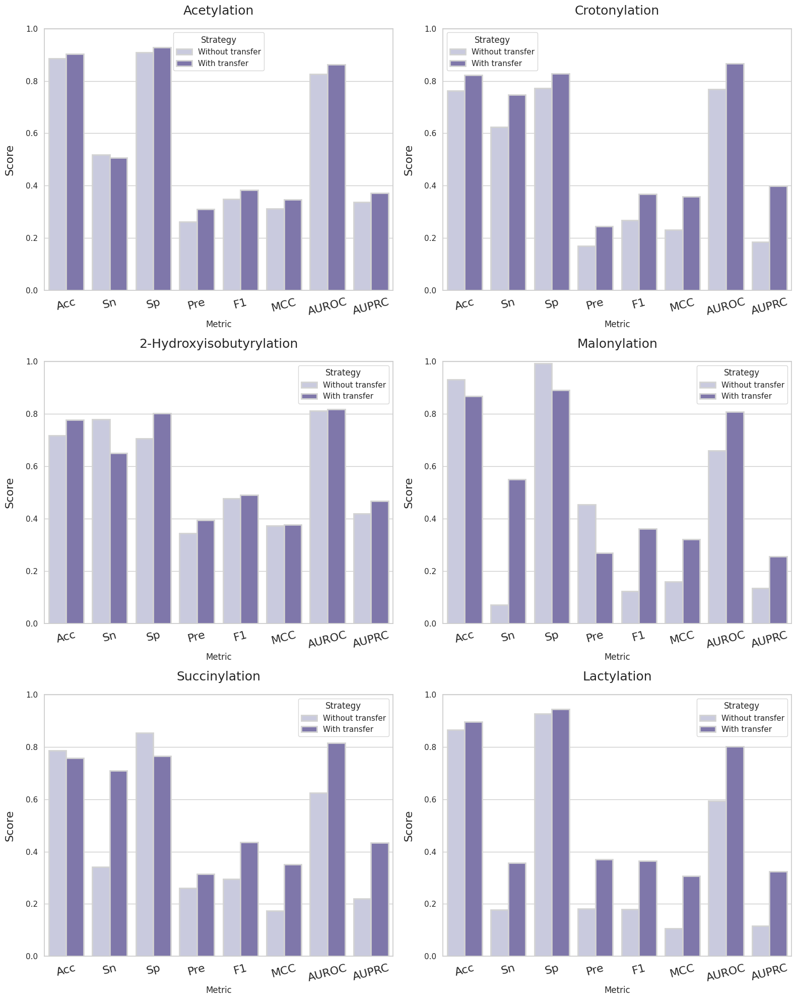

In [57]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 假设 ratio1_no_transfer 和 ratio1_transfer 已经赋值给 df1 和 df2
df1 = ratio_all_no_transfer.copy()
df2 = ratio_all_transfer.copy()

# 将指标名称存储在字典中
pdict = {'Kac':'Acetylation', 'Kcr':'Crotonylation', 'Kmal':'Malonylation', 
         'Ksucc':'Succinylation', 'Khib':'2-Hydroxyisobutyrylation', 'Kla':'Lactylation'}

# 配置可视化参数
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['axes.labelsize'] = 16
plt.rcParams['axes.titlesize'] = 18
sns.set_theme(style="whitegrid")

# 指定绘制的指标
metrics = ['Acc', 'Rec/Sn', 'Spe', 'Pre', 'F1', 'MCC', 'AUROC', 'AUPRC']

# 创建3x2的子图
fig, axes = plt.subplots(3, 2, figsize=(16, 20))  # 3行2列的子图布局

# 展平axes数组，方便循环访问
axes = axes.flatten()

# 为每个PTM绘制图形
for idx, ptm in enumerate(df1['PTM'].unique()):
    # 获取迁移前后的数据
    df1_ptm = df1[df1['PTM'] == ptm]
    df2_ptm = df2[df2['PTM'] == ptm]
    
    # 创建数据框，包含迁移前后的指标
    melted_data = pd.DataFrame({
        'Metric': metrics * 2,
        'Score': list(df1_ptm[metrics].values.flatten()) + list(df2_ptm[metrics].values.flatten()),
        'Strategy': ['Without transfer'] * len(metrics) + ['With transfer'] * len(metrics),
        'PTM': [pdict[ptm.replace('k','K')]] * len(metrics) * 2
    })
    
    # 获取当前子图的轴
    ax = axes[idx]
    
    # 绘制分组柱状图
    bar = sns.barplot(x='Metric', y='Score', hue='Strategy', data=melted_data, palette='Purples', 
                      ax=ax, edgecolor='lightgrey', linewidth=2)  # 添加柱子边框
    
    # 添加数值标签
#     for p in bar.patches:
#         height = p.get_height()
#         bar.annotate(f'{height:.2f}', 
#                      (p.get_x() + p.get_width()/2., height), 
#                      ha='center', va='center', 
#                      fontsize=10, color='black', 
#                      xytext=(0, 5), 
#                      textcoords='offset points')

    # 美化图形
    ptm = ptm.replace('k','K')
    ax.set_title(f'{pdict[ptm]}', fontsize=18, pad=20)
    ax.set_ylabel('Score', fontsize=16, labelpad=15)
    ax.set_ylim(0, 1)
    
    # 调整X轴标签
    metric_labels = ['Acc', 'Sn', 'Sp', 'Pre', 'F1', 'MCC', 'AUROC', 'AUPRC']
    ax.set_xticks(range(len(metrics)))
    ax.set_xticklabels(metric_labels, rotation=15, fontsize=16)

# 如果某些PTM数量少于6个，填充剩余的空白子图
# for i in range(len(df1['PTM'].unique()), len(axes)):
#     axes[i].axis('off')  # 将空白图关闭，避免显示空白区域

# 调整布局，确保图形不会重叠
plt.tight_layout()


# 显示图形
plt.savefig('ratio_all_comparioson_wo_transfer.png', dpi=600)

In [177]:
from sklearn.metrics import matthews_corrcoef, confusion_matrix, roc_curve, auc, precision_recall_curve
from sklearn.manifold import TSNE
def draw_tsne(test_labels, embedding, save_path, ptm_type='Kbhb'):
    X_embedded = TSNE(n_components=2).fit_transform(embedding)
    
    fig, ax = plt.subplots()
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    
    # Define color scheme for the purple theme
    non_ptm_color = '#03BECA'  # Purple color for non-PTM sites
    ptm_color = '#F77672'       # Darker purple for PTM sites
    
    for val, color, ptm, size in [("0", non_ptm_color, f'Non-{ptm_type} sites',10), 
                            ("1", ptm_color, f'{ptm_type} sites',20)]:
        val = int(val)
        idx = np.where(test_labels == val)
        plt.scatter(X_embedded[idx, 0], X_embedded[idx, 1], s=size, alpha=0.8, c=color, label=ptm.replace('k','K'))
    
    plt.legend(loc='upper right', prop={'size': 10}, scatterpoints=1)

    plt.savefig(save_path, dpi=600, bbox_inches='tight')

/home/zhqin/project/2024/01.SLAM/Rice_result/plot_tsne/tSNE
kac | fea_in:	 (12931, 2091)


/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


kac | fusion_out:	 (12931, 128)


/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


kac | attn_out:	 (12931, 128)


/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


kcr | fea_in:	 (2913, 2091)


/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


kcr | fusion_out:	 (2913, 128)


/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


kcr | attn_out:	 (2913, 128)


/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


khib | fea_in:	 (12137, 2091)


/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


khib | fusion_out:	 (12137, 128)


/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


khib | attn_out:	 (12137, 128)


/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


kmal | fea_in:	 (1045, 2091)


/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


kmal | fusion_out:	 (1045, 128)


/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


kmal | attn_out:	 (1045, 128)


/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


ksucc | fea_in:	 (2266, 2091)


/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


ksucc | fusion_out:	 (2266, 128)


/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


ksucc | attn_out:	 (2266, 128)


/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


kla | fea_in:	 (1212, 2091)


/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


kla | fusion_out:	 (1212, 128)


/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


kla | attn_out:	 (1212, 128)


/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


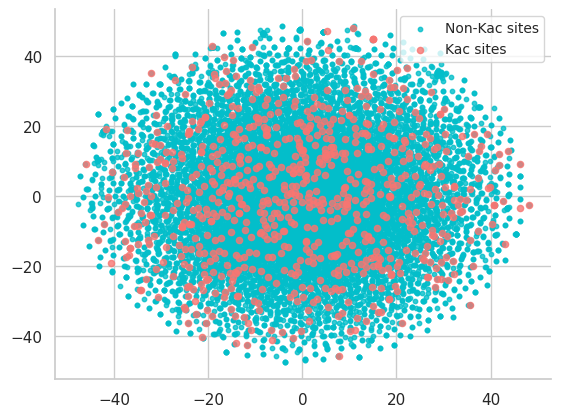

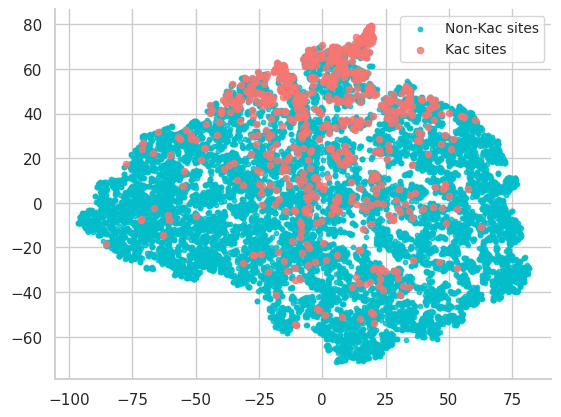

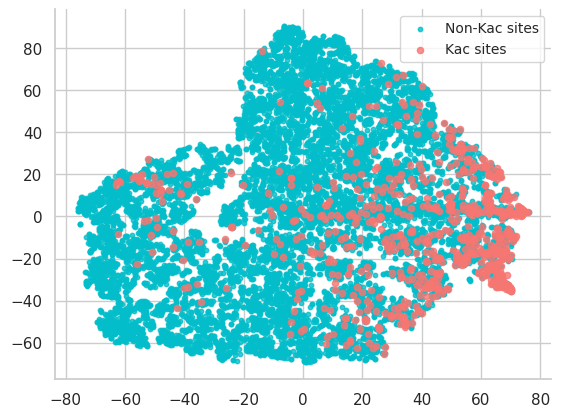

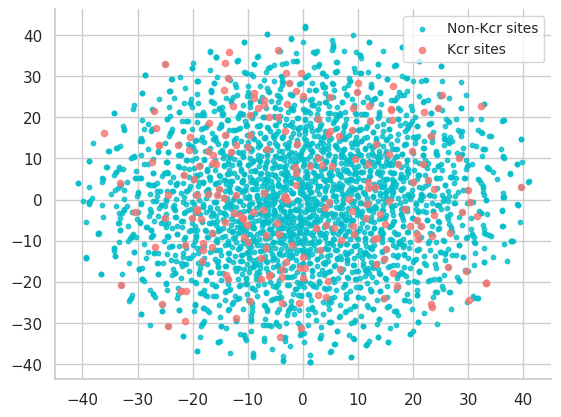

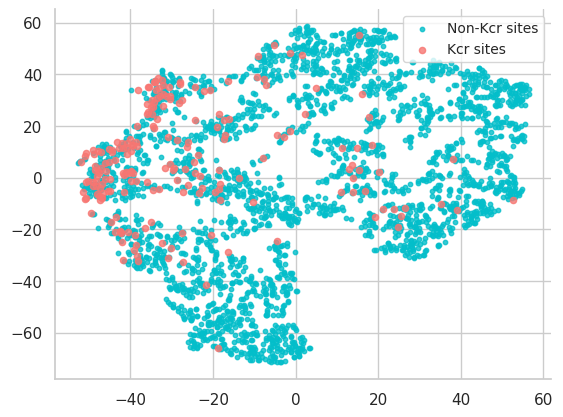

...

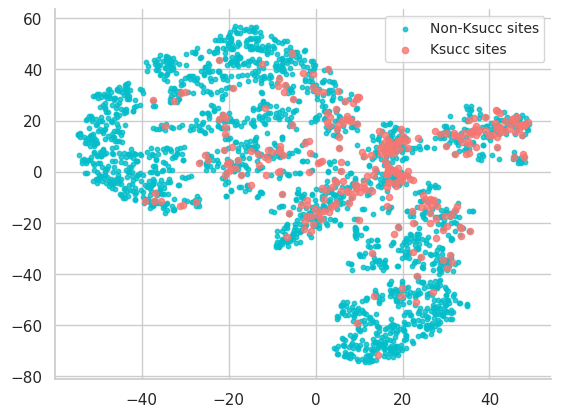

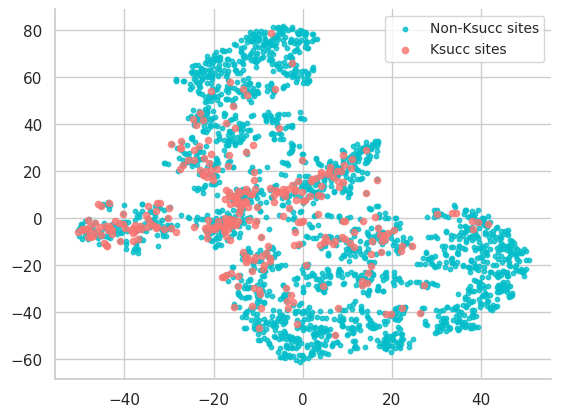

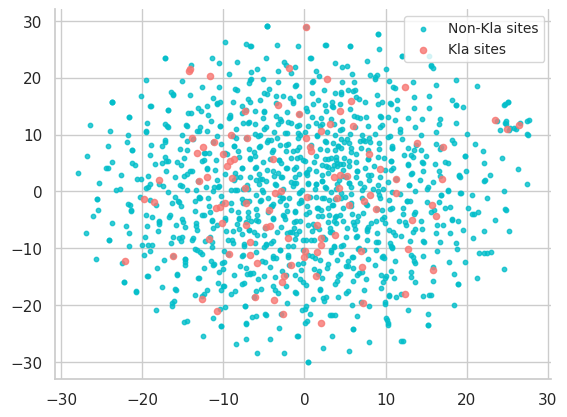

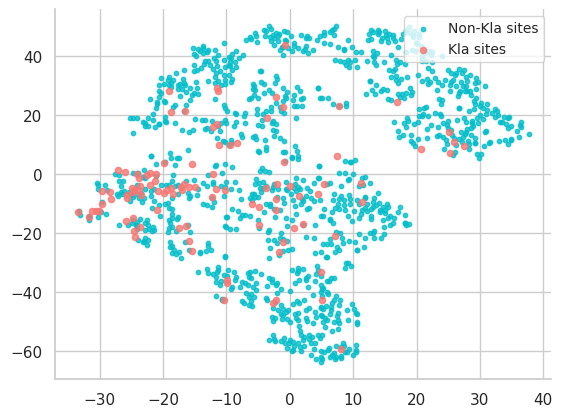

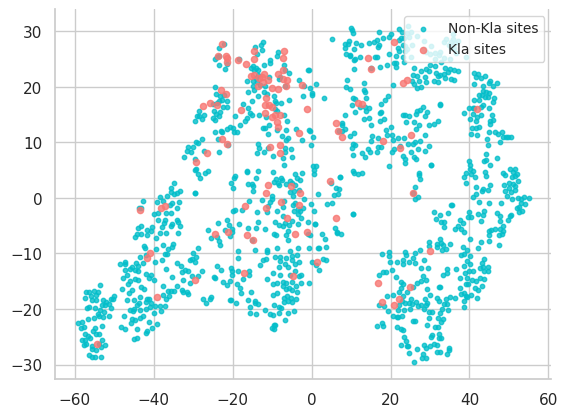

In [182]:
import pickle
with open('/home/zhqin/project/2024/01.SLAM/Rice_result/embedding.pkl', 'rb') as f:
    embedding_dict = pickle.load(f)
emd_list = ['fea_in', 'fusion_out', 'attn_out']
os.makedirs(osp.join('/home/zhqin/project/2024/01.SLAM/Rice_result/plot_tsne', f'tSNE'), exist_ok=True)
print(osp.join('/home/zhqin/project/2024/01.SLAM/Rice_result/plot_tsne', f'tSNE'))
for ptm in embedding_dict.keys():
    emd_dict = dict(embedding_dict[ptm])
    test_targets = emd_dict['test_targets']
    for ind, (key) in enumerate(emd_list):
        data = emd_dict[key]
        data = np.concatenate(data, axis=0)
        if len(data.shape) > 2:
            data = data.reshape(data.shape[0], np.prod(data.shape[1:]))
        print(f'{ptm} | {key}:\t', data.shape)
        save_path = osp.join('/home/zhqin/project/2024/01.SLAM/Rice_result/plot_tsne', f'tSNE/{ptm}_{key}.png')
        draw_tsne(test_targets, data, save_path, ptm_type=ptm)

/home/zhqin/project/2024/01.SLAM/Rice_result/plot_tsne/tSNE_no_transfer
kac | fea_in:	 (12931, 2091)


/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


kac | fusion_out:	 (12931, 128)


/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


kac | attn_out:	 (12931, 128)


/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


kcr | fea_in:	 (2913, 2091)


/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


kcr | fusion_out:	 (2913, 128)


/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


kcr | attn_out:	 (2913, 128)


/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


khib | fea_in:	 (12137, 2091)


/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


khib | fusion_out:	 (12137, 128)


/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


khib | attn_out:	 (12137, 128)


/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


kmal | fea_in:	 (1045, 2091)


/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


kmal | fusion_out:	 (1045, 128)


/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


kmal | attn_out:	 (1045, 128)


/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


ksucc | fea_in:	 (2266, 2091)


/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


ksucc | fusion_out:	 (2266, 128)


/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


ksucc | attn_out:	 (2266, 128)


/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


kla | fea_in:	 (1212, 2091)


/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


kla | fusion_out:	 (1212, 128)


/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


kla | attn_out:	 (1212, 128)


/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/zhqin/anaconda3/envs/pyg/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


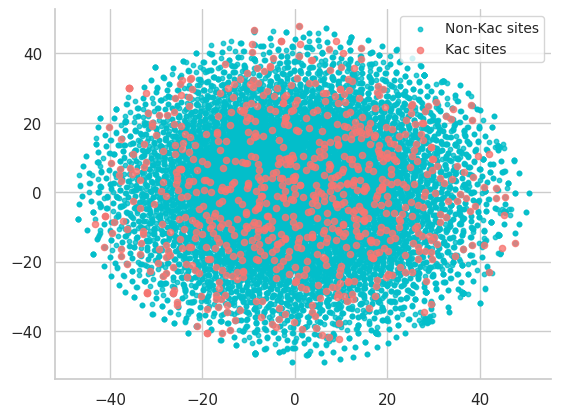

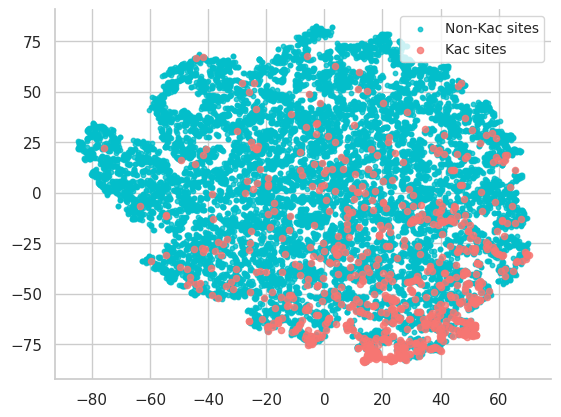

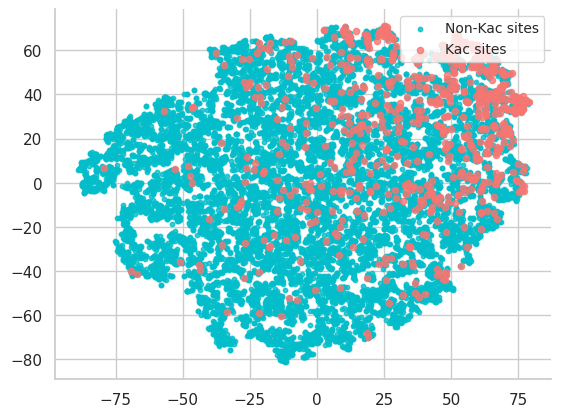

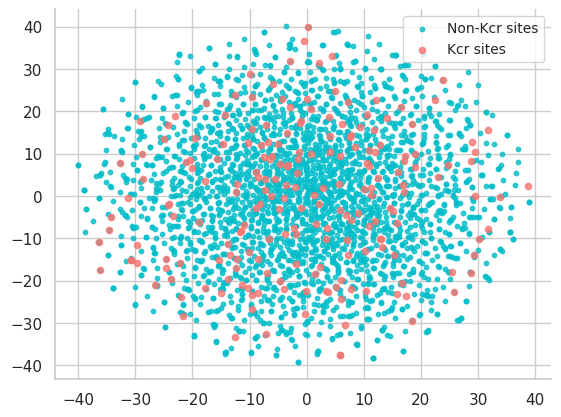

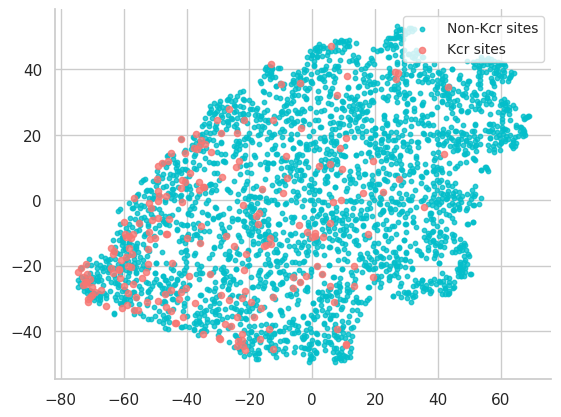

...

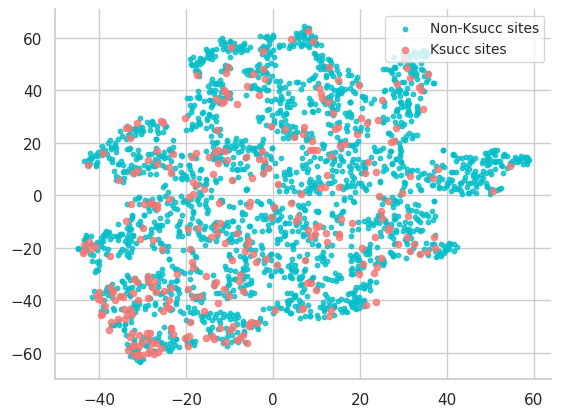

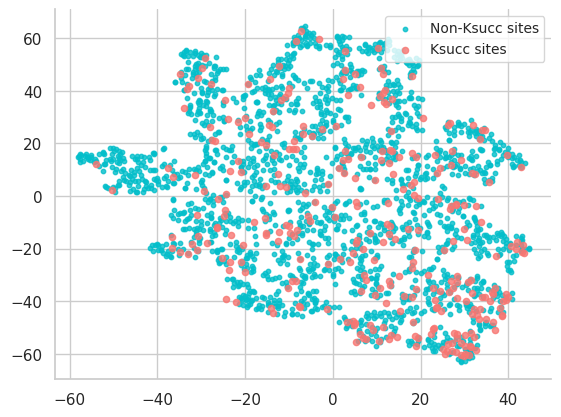

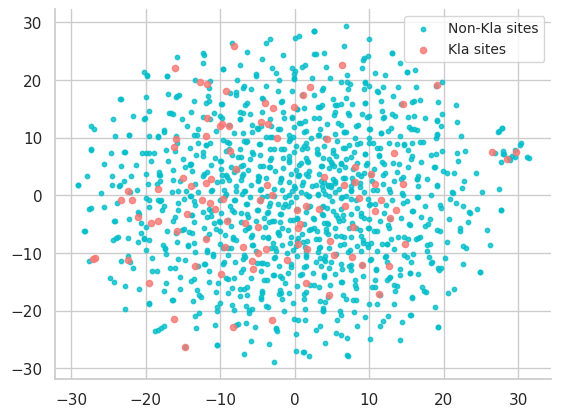

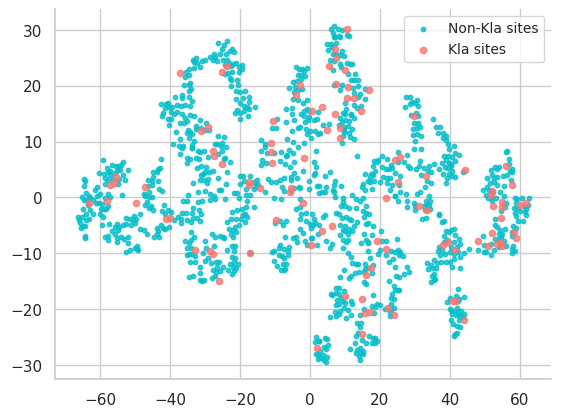

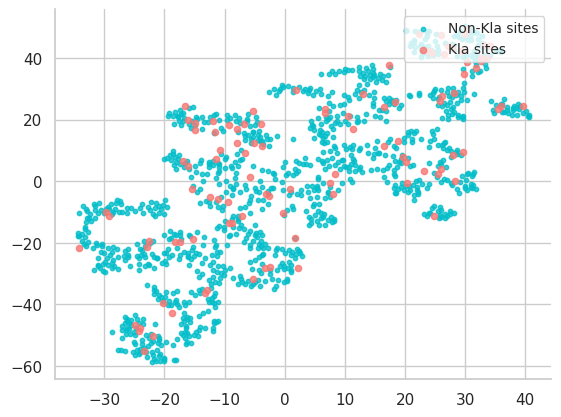

In [183]:
import pickle
with open('/home/zhqin/project/2024/01.SLAM/Rice_result/embedding_no_transfer.pkl', 'rb') as f:
    embedding_dict = pickle.load(f)
emd_list = ['fea_in', 'fusion_out', 'attn_out']
os.makedirs(osp.join('/home/zhqin/project/2024/01.SLAM/Rice_result/plot_tsne', f'tSNE_no_transfer'), exist_ok=True)
print(osp.join('/home/zhqin/project/2024/01.SLAM/Rice_result/plot_tsne', f'tSNE_no_transfer'))
for ptm in embedding_dict.keys():
    emd_dict = dict(embedding_dict[ptm])
    test_targets = emd_dict['test_targets']
    for ind, (key) in enumerate(emd_list):
        data = emd_dict[key]
        data = np.concatenate(data, axis=0)
        if len(data.shape) > 2:
            data = data.reshape(data.shape[0], np.prod(data.shape[1:]))
        print(f'{ptm} | {key}:\t', data.shape)
        save_path = osp.join('/home/zhqin/project/2024/01.SLAM/Rice_result/plot_tsne', f'tSNE_no_transfer/{ptm}_{key}.png')
        draw_tsne(test_targets, data, save_path, ptm_type=ptm)

In [380]:
df

,ID,PTM,Sequence,Position,Score,Prediction,Confidence
0,O04138,Kac,XXMAAKMATMV,4,0.001446,No,Not modified
1,O04138,Kac,GMAGRKAGAGA,75,0.024295,No,Not modified
2,O04138,Kac,FFNGIKNQAPN,97,0.040381,No,Not modified
3,O04138,Kac,NGCAGKSFYTR,107,0.079458,No,Not modified
4,O04138,Kac,TNDDSKREIAA,135,0.045792,No,Not modified
...,...,...,...,...,...,...,...
79,O04138,Kla,YGPAGKNIGFD,200,0.233169,Yes,High
80,O04138,Kla,LRDPDKVAQDP,212,0.145162,Yes,Low
81,O04138,Kla,PTISFKTALWF,222,0.027449,No,Not modified
82,O04138,Kla,LECNGKNPGAV,256,0.230322,Yes,High


In [2]:
df = pd.read_csv('/home/zhqin/project/2024/01.SLAM/SLAM_rice/Results_all.csv', sep='\t')
# df['Confidence'] = ['Non'  if 'Non' in a else a for a in  df['Confidence'].tolist()]

In [3]:
pred = df[df['Confidence']=='Low']
pos = pred.groupby(['PTM','Position']).size().unstack(fill_value=0)
pos

Position,75,107,135,179,180,212,256
PTM,,,,,,,
Kcr,1,0,1,0,0,0,1
Kla,0,1,0,0,0,1,0
Kmal,0,0,1,1,0,0,0
Ksucc,0,0,0,1,1,1,0


In [425]:
def draw_pie(df, savepath='pie.png'):
    plt.rcParams['font.family'] = 'Times New Roman'
    # 统计不同PTM修饰在不同置信度下的占比
    ptm_confidence_counts = df.groupby(['PTM', 'Confidence']).size().unstack(fill_value=0)

    # 设置Seaborn风格
    sns.set(style="whitegrid")
    plt.figure(figsize=(14, 10))

    # 绘制子图
    for i, ptm in enumerate(['Kac', 'Kcr', 'Khib', 'Kmal', 'Ksucc','Kla']):
        plt.subplot(2, 3, i + 1)  # 2行3列布局
        wedges, texts, autotexts = plt.pie(
            ptm_confidence_counts.loc[ptm], 
            labels=None,  # 不显示标签，避免重叠
            autopct='%1.0f%%', 
            colors=sns.color_palette("Pastel1"), 
            startangle=90,
            pctdistance=0.85  # 调整百分比显示位置
        )
        plt.title(f'{ptm}', fontsize=18)

    # 添加统一图例
    plt.figlegend(
        wedges, 
        ['High (Sp>=95%)', 'Low (Sp>=85%)', 'Medium (Sp>=90%)', 'Not modified'], 
        loc='upper right', 
        bbox_to_anchor=(1.1, 1.1), 
        fontsize=16
    )
    plt.tight_layout()
    plt.savefig(savepath, dpi=300)

def draw_bar(df, savepath='bar.png'):
    plt.rcParams['font.family'] = 'Times New Roman'
    threshold_data = {'seq':{"Kac": {"Sp 95": 0.20, "Sp 90": 0.15, "Sp 85": 0.11, "Sp 80": 0.09},
        "Kcr": {"Sp 95": 0.25, "Sp 90": 0.2, "Sp 85": 0.15, "Sp 80": 0.10},
        "Khib": {"Sp 95": 0.4, "Sp 90": 0.36, "Sp 85": 0.34, "Sp 80": 0.29},
        "Kmal": {"Sp 95": 0.20, "Sp 90": 0.15, "Sp 85": 0.11, "Sp 80": 0.09},
        "Ksucc": {"Sp 95": 0.231041, "Sp 90": 0.228401, "Sp 85": 0.202869, "Sp 80": 0.179731},
        "Kla": {"Sp 95": 0.224914, "Sp 90": 0.175495, "Sp 85": 0.142771, "Sp 80": 0.112467}}}

    sns.set(style="whitegrid")
    plt.figure(figsize=(16, 10))

    # 定义PTM类型
    ptm_types = ['Kac', 'Kcr', 'Khib', 'Kmal', 'Ksucc', 'Kla']

    # 绘制每个PTM打分的柱状图
    for i, ptm in enumerate(ptm_types):
        plt.subplot(2, 3, i + 1)  # 2行3列布局
        sns.barplot(x='Position', y='Score', data=df[df['PTM']==ptm], palette='Pastel1',errcolor='none')
        plt.title(f'{ptm}', fontsize=16, pad=10)
        plt.xticks(rotation = 60)
    #     plt.axhline(y=threshold_data['seq'][ptm]["Sp 95"],color='red', linestyle='--', linewidth=2)
    #     plt.axhline(y=threshold_data['seq'][ptm]["Sp 90"],color='purple', linestyle='--', linewidth=2)
        plt.axhline(y=threshold_data['seq'][ptm]["Sp 80"],color='purple', linestyle='--', linewidth=2)
        plt.xlabel('Position',labelpad=10)
        plt.ylabel('Score',labelpad=10)

    plt.tight_layout()
    plt.savefig(savepath, dpi=300)

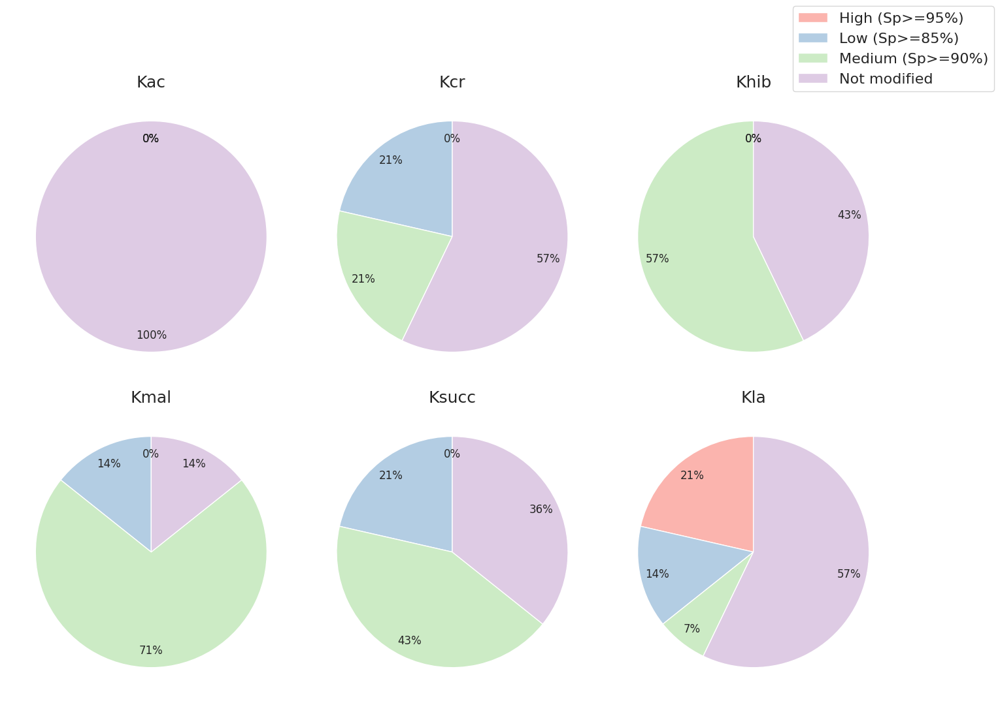

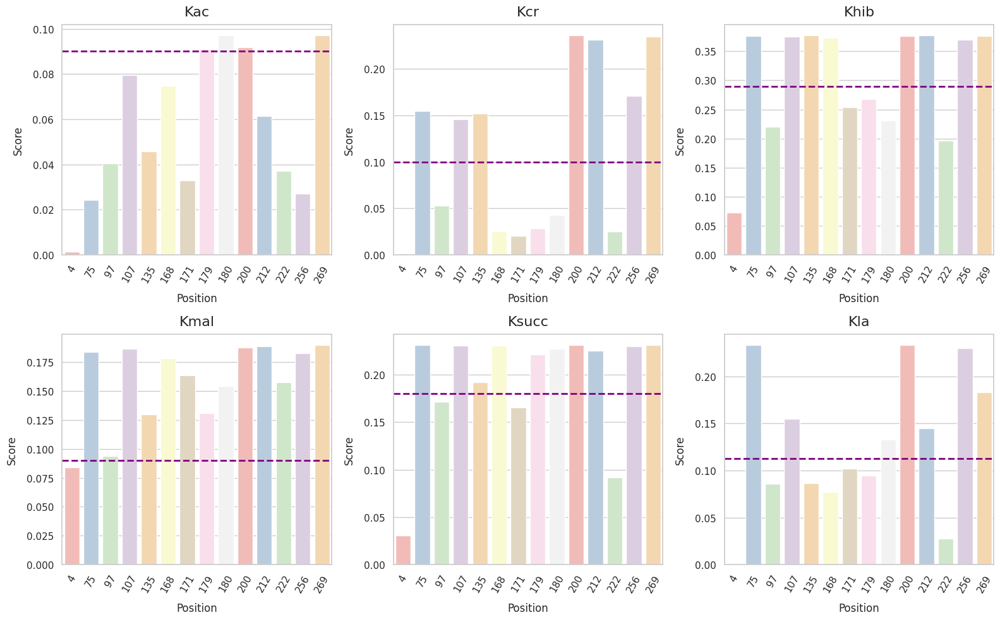

In [426]:
draw_pie(df)
draw_bar(df, 'bar.png')

In [439]:
df = pd.read_csv('/home/zhqin/project/2024/01.SLAM/SLAM_rice_cv_all/SLAM_rice_cv_all/Kla_fold_result_cv.csv', sep='\t')
df

import pandas as pd

# 假设你的DataFrame是 df
# df = pd.read_csv('your_file.csv')  # 如果数据存储在CSV中

# 计算每个PTM类型的平均值和标准差
grouped = df.groupby('PTM').agg({
    'Acc': ['mean', 'std'],
    'Rec/Sn': ['mean', 'std'],
    'Pre': ['mean', 'std'],
    'F1': ['mean', 'std'],
    'Spe': ['mean', 'std'],
    'MCC': ['mean', 'std'],
    'AUROC': ['mean', 'std'],
    'AUPRC': ['mean', 'std']
}).reset_index()

# 将列名格式化为 'Metric_mean' 和 'Metric_std' 格式
grouped.columns = ['PTM', 
                   'Acc_mean', 'Acc_std',
                   'Rec/Sn_mean', 'Rec/Sn_std',
                   'Pre_mean', 'Pre_std',
                   'F1_mean', 'F1_std',
                   'Spe_mean', 'Spe_std',
                   'MCC_mean', 'MCC_std',
                   'AUROC_mean', 'AUROC_std',
                   'AUPRC_mean', 'AUPRC_std']

# # 创建一个新的DataFrame，将均值和标准差格式化为“mean ± std”的形式
# formatted = grouped.copy()
# for column in grouped.columns[1:]:
#     mean_col = column.replace('std', 'mean')
#     formatted[column] = formatted[mean_col].round(4).astype(str) + " ± " + formatted[column].round(4).astype(str)

# formatted
cc = ['Acc_mean','Rec/Sn_mean','Pre_mean','F1_mean','Spe_mean','MCC_mean','AUROC_mean', 'AUPRC_mean']
grouped[cc]

,Acc_mean,Rec/Sn_mean,Pre_mean,F1_mean,Spe_mean,MCC_mean,AUROC_mean,AUPRC_mean
0,0.899585,0.549680,0.315118,0.397500,0.922120,0.365325,0.870742,0.382273
1,0.857810,0.686352,0.307226,0.421438,0.871686,0.393543,0.878124,0.407808
2,0.777012,0.736191,0.407158,0.523897,0.785153,0.423644,0.840610,0.557994
3,0.816090,0.613061,0.252800,0.350648,0.834327,0.306901,0.819196,0.279807
4,0.865800,0.629881,0.319000,0.420002,0.884405,0.382718,0.864367,0.376493
5,0.821701,0.692370,0.366056,0.477847,0.839047,0.411680,0.857234,0.477727


grouped['AUROC_mean']

In [438]:
df = pd.read_csv('/home/zhqin/project/2024/01.SLAM/SLAM_rice_cv_ratio1/SLAM_rice_cv_ratio1/Kla_fold_result_cv.csv', sep='\t')
df

import pandas as pd

# 假设你的DataFrame是 df
# df = pd.read_csv('your_file.csv')  # 如果数据存储在CSV中

# 计算每个PTM类型的平均值和标准差
grouped = df.groupby('PTM').agg({
    'Acc': ['mean', 'std'],
    'Rec/Sn': ['mean', 'std'],
    'Pre': ['mean', 'std'],
    'F1': ['mean', 'std'],
    'Spe': ['mean', 'std'],
    'MCC': ['mean', 'std'],
    'AUROC': ['mean', 'std'],
    'AUPRC': ['mean', 'std']
}).reset_index()

# 将列名格式化为 'Metric_mean' 和 'Metric_std' 格式
grouped.columns = ['PTM', 
                   'Acc_mean', 'Acc_std',
                   'Rec/Sn_mean', 'Rec/Sn_std',
                   'Pre_mean', 'Pre_std',
                   'F1_mean', 'F1_std',
                   'Spe_mean', 'Spe_std',
                   'MCC_mean', 'MCC_std',
                   'AUROC_mean', 'AUROC_std',
                   'AUPRC_mean', 'AUPRC_std']

# formatted
cc = ['Acc_mean','Rec/Sn_mean','Pre_mean','F1_mean','Spe_mean','MCC_mean','AUROC_mean', 'AUPRC_mean']
grouped[cc]

,Acc_mean,Rec/Sn_mean,Pre_mean,F1_mean,Spe_mean,MCC_mean,AUROC_mean,AUPRC_mean
0,0.783015,0.804896,0.771468,0.787505,0.760442,0.566672,0.854501,0.843702
1,0.811111,0.873895,0.780031,0.822112,0.746109,0.630647,0.885076,0.869508
2,0.769529,0.843590,0.735036,0.785288,0.695397,0.545637,0.845883,0.821658
3,0.761491,0.809780,0.752334,0.771160,0.718390,0.540207,0.825128,0.805444
4,0.796283,0.836211,0.783083,0.803270,0.756890,0.600929,0.852303,0.833317
5,0.778414,0.833893,0.754800,0.789524,0.723136,0.565617,0.850714,0.821759


In [4]:
df = pd.read_csv('/mnt/data2024/zhqin/project/SLAM/RicePTM/Rice_acylome.csv', sep='\t')

In [5]:
df[df['Prediction']=='Yes']

,ID,PTM,Sequence,Position,Score,Prediction,Confidence
42,A2WPQ8,Kac,EMVEHEDDAAYTSMNHDELLKLFFAKKLEGKNFLNPIKKLKNSGXX...,521,0.095950,Yes,Not modified
52,A2WRI5,Kac,GTSAATNSSAAQGSGIVKTETGFLFKRFRPWPANXXXXXXXXXXXX...,109,0.098990,Yes,Not modified
63,A2WZ69,Kac,AAKQKGSFHAWSQIQRNSINGQKAVKWLERESSAPHSKSQDGVQCA...,31,0.096441,Yes,Not modified
85,A2WZD6,Kac,KLTCPKNDTANTTVNDIRTPNAFDNKYYVDLQNRQGLFTSDQDLFV...,267,0.098544,Yes,Not modified
90,A2X1H1,Kac,GGWLVEADEEPAPAADFLSRCFLCDKRLDGLDIYMYRGEKAFCSSE...,155,0.093245,Yes,Not modified
...,...,...,...,...,...,...,...
4027593,Q38G74,Kla,KIPAGLAPEQAAPLLCAGLTVYSPLKHFGLMSPGLRGGVLGLGGVG...,173,0.215975,Yes,Medium
4027594,Q38G74,Kla,KHFGLMSPGLRGGVLGLGGVGHMGVKVAKSMGHHVTVISSSARKRG...,198,0.155965,Yes,Low
4027595,Q38G74,Kla,GLMSPGLRGGVLGLGGVGHMGVKVAKSMGHHVTVISSSARKRGEAM...,201,0.233169,Yes,High
4027596,Q38G74,Kla,GVGHMGVKVAKSMGHHVTVISSSARKRGEAMDDLGADAYLVSSDAA...,216,0.233169,Yes,High


In [6]:
score_dict = {'Kac':0.095, 'Kcr':0.235689, 'Khib':0.377,'Kmal':0.185, 'Ksucc':0.2308, 'Kla':0.23315}
ptm_categories = df['PTM'].unique()
# 遍历每一种 PTM 分类
for i, ptm in enumerate(ptm_categories):
    p = df[df['PTM']==ptm].copy()
    p['Score_norm'] = df[['Score']].apply(normalize)
    pred = p[p['Score']>=score_dict[ptm]]
    print(ptm, pred['ID'].unique().shape[0], pred.shape[0])

NameError: name 'normalize' is not defined

In [671]:
pred['ID'].unique().shape

(23228,)

In [687]:
poscount['Unique_Position_Count'] = [a if a < upper_bound else 'other' for a in poscount['Unique_Position_Count'].tolist()]

(1.0, 12.0)

In [699]:
ptm_categories = df['PTM'].unique()

for i, ptm in enumerate(ptm_categories):
    p = df[df['PTM'] == ptm].copy()
    p['Score_norm'] = df[['Score']].apply(normalize)
    pred = p[p['Score'] >= score_dict[ptm]]
pred

,ID,PTM,Sequence,Position,Score,Prediction,Confidence,Score_norm
3356342,A2WK53,Kla,PWGDCCTNTTCTRSIPPICRCNDKVKKCAAACKDCKRVKSSKPPRY...,141,0.233169,Yes,High,0.61825
3356343,A2WK53,Kla,WGDCCTNTTCTRSIPPICRCNDKVKKCAAACKDCKRVKSSKPPRYV...,142,0.233169,Yes,High,0.61825
3356347,A2WK53,Kla,PICRCNDKVKKCAAACKDCKRVKSSKPPRYVCQDQFTGQPGPKCKH...,157,0.233169,Yes,High,0.61825
3356351,A2WNV1,Kla,EHGRCPINALKLRVCANVLNRLVDVKIGHGPDDCCSLLSGIADLDA...,77,0.233169,Yes,High,0.61825
3356384,A2WRI5,Kla,XXMTGRVGPFVDGLDEAKTTARALPKRPAKPGFSITVVENHRPTYH...,24,0.233169,Yes,High,0.61825
...,...,...,...,...,...,...,...,...
4027588,Q38G74,Kla,GASKYPMVPGHEVVGEVVEVGPEVTKYSAGDVVGVGVIVGCCRECH...,84,0.233169,Yes,High,0.61825
4027590,Q38G74,Kla,VGVGVIVGCCRECHPCKANVEQYCNKRIWSYNDVYTDGRPTQGGFA...,116,0.233169,Yes,High,0.61825
4027592,Q38G74,Kla,DVYTDGRPTQGGFASAMVVDQKFVVKIPAGLAPEQAAPLLCAGLTV...,148,0.233169,Yes,High,0.61825
4027595,Q38G74,Kla,GLMSPGLRGGVLGLGGVGHMGVKVAKSMGHHVTVISSSARKRGEAM...,201,0.233169,Yes,High,0.61825


In [789]:
ptm_categories = df['PTM'].unique()

# 创建图形
for i, ptm in enumerate(ptm_categories):
    p = df_unique_sequences[df_unique_sequences['PTM'] == ptm].copy()
    p['Score_norm'] = p[['Score']].apply(normalize)
    
    # 使用 Score 进行筛选
    pred = p[p['Score'] >= score_dict[ptm]]
    sorted_pred = pred.sort_values(by='Score', ascending=True)
    # 获取该PTM对应的序列列表
    sequences = sorted_pred['Sequence'].tolist()
    with open(f'pred_acylome_seq/{ptm}.fa', 'w') as f:
        idx = 0
        for line in sequences:
            f.write(f'>s{idx}\n{line}\n')
            idx+=1

In [790]:
ptm_categories = df['PTM'].unique()

# 创建图形
for i, ptm in enumerate(ptm_categories):
    p = df_unique_sequences[df_unique_sequences['PTM'] == ptm].copy()
    # 使用 Score 进行筛选
    pred = p[p['Score'] < score_dict[ptm]]
    sorted_pred = pred.sort_values(by='Score')
    
    # 获取该PTM对应的序列列表
    sequences = sorted_pred[:10000]['Sequence'].tolist()
    with open(f'pred_acylome_seq/{ptm}_neg.fa', 'w') as f:
        idx = 0
        for line in sequences:
            f.write(f'>s{idx}\n{line}\n')
            idx+=1

In [807]:
seq_dict = {record.id:str(record.seq) for record in SeqIO.parse('/home/zhqin/project/2024/01.SLAM/SLAM_rice/rice_proteome.fasta', "fasta")} 

In [837]:
from Bio import SeqIO
ptm_categories = df['PTM'].unique()

# 创建图形
for i, ptm in enumerate(ptm_categories):
    p = df_unique_sequences[df_unique_sequences['PTM'] == ptm].copy()
    # 使用 Score 进行筛选
    pred = p[p['Score'] > score_dict[ptm]]
    sorted_pred = pred.sort_values(by='Score', ascending=True)
    with open(f'pred_acylome_seq/{ptm}_protein.fa', 'w') as f:
        idx = 0
        for line in sorted_pred['ID'].unique().tolist():
            # if 200 < len(seq_dict[line]) < 2000:
            f.write(f'>{line}\n{seq_dict[line]}\n')

In [836]:
sorted_pred

,ID,PTM,Sequence,Position,Score,Prediction,Confidence
3424410,A2YFS0,Kla,AEVGPTVGAERQCGRRQGAGSREASKAGQRSAPAQCPRADGGFDGG...,86,0.233150,Yes,High
3686984,A2YT10,Kla,QKESCEGLTALQKAKIAGISDIESFKRLLKGLTEKVSWQSDAASAI...,289,0.233150,Yes,High
4005924,B8B3E3,Kla,AIKRRTTMVAVGCALDPVAAVVGGGKNKTRLLPPLNGSAEDGGKGS...,27,0.233150,Yes,High
3736095,A2YIR6,Kla,PGFESVFSSEIIPGMVISPVSTTSGKKQYITVRVSKDQNSGDWQIY...,92,0.233150,Yes,High
3931315,A2XDS0,Kla,WSKYGHHLLASATDKSLTLWHVVNEKKIARITLQQTPLSVRLHPGG...,100,0.233150,Yes,High
...,...,...,...,...,...,...,...
3584647,B8AA73,Kla,MEELVPGGRVGRDAFLSLLGYLYTGKLRPAPDDVVSCADPMCPHDS...,119,0.233169,Yes,High
3584650,B8AA73,Kla,DKTLVEDVLPILQVAFHSELTPVLEKCIRRIARSNLDNVSLDKELP...,200,0.233169,Yes,High
3584657,B8AA73,Kla,HYAAAYCDSKVVSELLDLRLANLNLKNSRGYTALHLAAMRREPAII...,310,0.233169,Yes,High
3584502,A2ZCG0,Kla,VMKILRTMGLMKDAVDFSSSLVYSEKKFVARYIDPYKQAAPTLADS...,357,0.233169,Yes,High


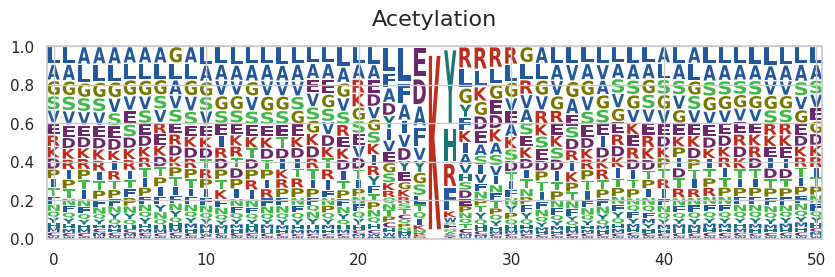

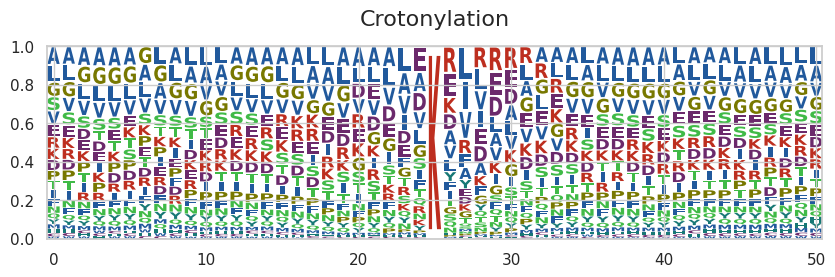

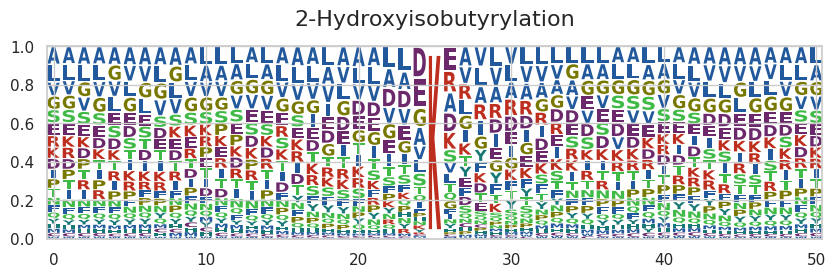

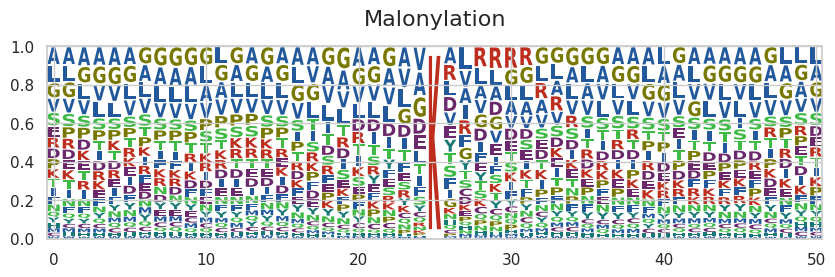

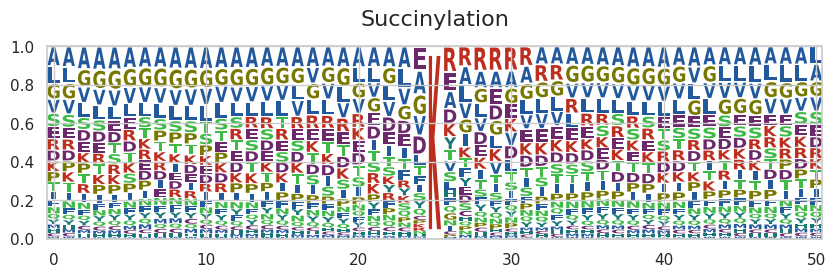

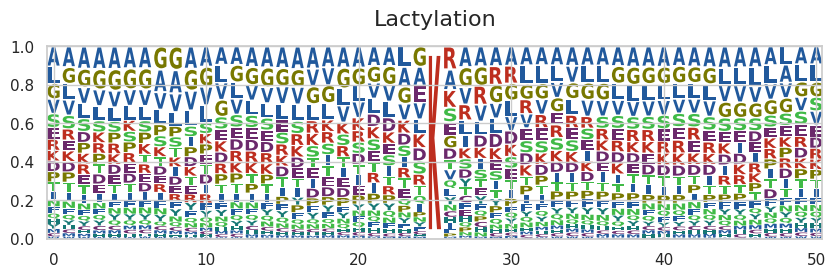

In [749]:
import pandas as pd
import numpy as np
import logomaker
import matplotlib.pyplot as plt

score_dict = {'Kac':0.095, 'Kcr':0.235689, 'Khib':0.377,'Kmal':0.185, 'Ksucc':0.2308, 'Kla':0.23315}

# 定义氨基酸字母表
aa_list = ['A', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'K', 'L', 'M', 'N', 'P', 'Q', 'R', 'S', 'T', 'V', 'W', 'Y']

# 假设df已经加载，并且包含PTM信息和序列数据
# 去除带有"X"的序列
df_unique_sequences = df[df['Sequence'].str.contains('X') == False]

# 获取 PTM 的分类列表
ptm_categories = df['PTM'].unique()

# 创建图形
for i, ptm in enumerate(ptm_categories):
    p = df_unique_sequences[df_unique_sequences['PTM'] == ptm].copy()
    p['Score_norm'] = p[['Score']].apply(normalize)
    
    # 使用 Score 进行筛选
    pred = p[p['Score'] >= score_dict[ptm]]
    
    # 获取该PTM对应的序列列表
    sequences = pred['Sequence'].tolist()

    # 生成序列logo所需的频率矩阵
    seq_matrix = []

    # 获取序列的每个位置的氨基酸频率
    for seq in sequences:
        seq_clean = ''.join([aa for aa in seq if aa.isalpha()])  # 去掉非字母字符

        if len(seq_clean) == len(sequences[0]):  # 确保序列长度一致
            seq_matrix.append(list(seq_clean))  # 转换成列表格式

    # 将序列矩阵转换为DataFrame，行是氨基酸，列是位置
    seq_df = pd.DataFrame(seq_matrix)

    # 计算每个位置的氨基酸频率
    count_df = pd.DataFrame(index=aa_list, columns=range(len(seq_df.columns)))

    for i in range(len(seq_df.columns)):  # 对每一列（每个位置）
        position_aa_counts = seq_df.iloc[:, i].value_counts()  # 统计该位置每个氨基酸的出现次数
        total_aa = len(sequences)  # 序列总数
        
        # 计算频率并更新到count_df
        for aa in aa_list:
            count_df.loc[aa, i] = position_aa_counts.get(aa, 0) / total_aa  # 计算频率

    # 将 count_df 转换为数值型数据，确保没有NaN值
    count_df = count_df.astype(float)  # 强制转换为浮动型
#     count_df = count_df.fillna(0)  # 填充 NaN 值为 0

    # 使用 logomaker 绘制序列logo
    seq_logo = logomaker.Logo(count_df.transpose(),font_name='Stencil Std',
                         color_scheme='NajafabadiEtAl2017',
                         vpad=.1,
                         width=.8)

    # 设置标题
    plt.title(f'{pdict[ptm]}', fontsize=16, pad=15)

    # 显示图形
    plt.show()


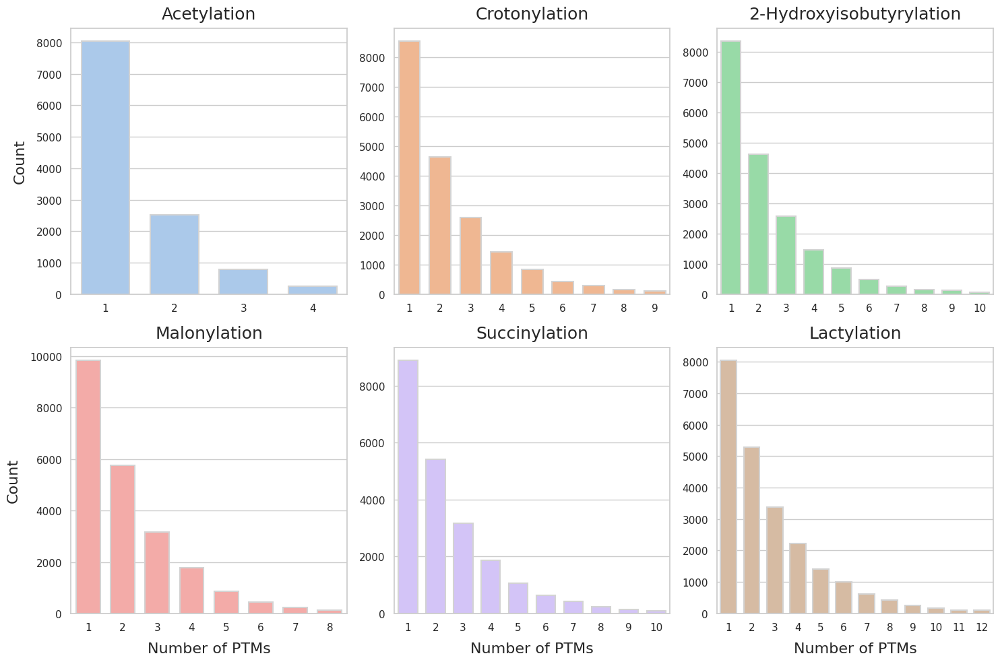

In [7]:
import seaborn as sns
import matplotlib.pyplot as plt

normalize = lambda x: (x - x.min()) / (x.max() - x.min())
# 设置绘图样式
sns.set(style="whitegrid")

# 定义PTM字典
pdict = {'Kac':'Acetylation', 'Kcr':'Crotonylation', 'Kmal':'Malonylation', 
         'Ksucc':'Succinylation', 'Khib':'2-Hydroxyisobutyrylation', 'Kla':'Lactylation'}

# 获取 PTM 的分类列表
ptm_categories = df['PTM'].unique()

# 设置颜色和线型
palette = sns.color_palette("pastel", n_colors=len(ptm_categories))  # Changed color palette

# 创建一个 2x3 的子图布局 (6 个子图)
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

# 将 axes 展开为一维数组，以便遍历
axes = axes.flatten()

# 创建子图
for i, ptm in enumerate(ptm_categories):
    ax = axes[i]
    p = df[df['PTM'] == ptm].copy()
    p['Score_norm'] = df[['Score']].apply(normalize)
    pred = p[p['Score'] >= score_dict[ptm]]
    
    # 计算每个 ID 的 unique Position 数量
    poscount = pred.groupby('ID')['Position'].nunique().reset_index()
    poscount.columns = ['ID', 'Unique_Position_Count']
    
    # 移除极端值 (例如：去掉大于 99% 或小于 1% 的位置数量)
    lower_bound = poscount['Unique_Position_Count'].quantile(0.01)
    upper_bound = poscount['Unique_Position_Count'].quantile(0.99)
    poscount = poscount[(poscount['Unique_Position_Count'] <= upper_bound)]
    # poscount['Unique_Position_Count'] = [a if a < upper_bound else 'other' for a in poscount['Unique_Position_Count'].tolist()]
    # 绘制当前 PTM 的柱状图
    sns.barplot(data=poscount, x='Unique_Position_Count', 
                y=poscount.groupby('Unique_Position_Count')['ID'].transform('count'),
                color=palette[i], ax=ax,edgecolor='lightgrey', linewidth=1.5, width=0.7)  # Added edgecolor and adjusted width

    # 设置标题和标签
    ax.set_title(f'{pdict[ptm]}', fontsize=18, pad=10)  # Increased font size for title
    if i > 2:
        ax.set_xlabel('Number of PTMs', fontsize=16, labelpad=10)
    else:
        ax.set_xlabel('')
    if i == 0 or i == 3:
        ax.set_ylabel('Count', fontsize=16, labelpad=10)
    else:
        ax.set_ylabel('')
    
#     ax.grid(False)

# 调整布局
plt.tight_layout()

# 保存图片
plt.savefig('acylome_number_of_ptms.png', dpi=600)


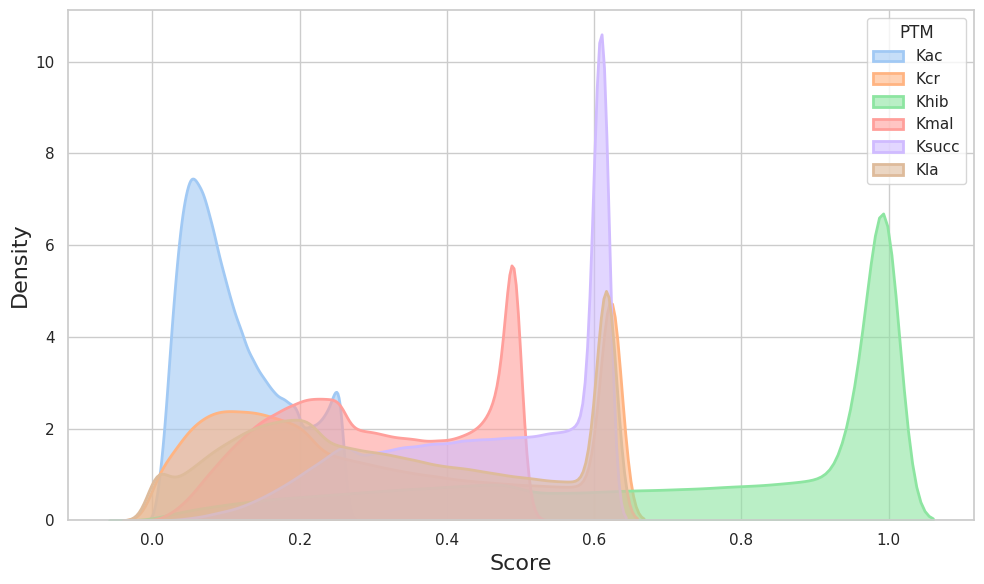

In [8]:
import seaborn as sns
import matplotlib.pyplot as plt

# 设置绘图样式
sns.set(style="whitegrid")

# 获取 PTM 的分类列表
ptm_categories = df['PTM'].unique()

# 设置颜色和线型
palette = sns.color_palette("pastel", n_colors=len(ptm_categories))

# 创建图形
plt.figure(figsize=(10, 6))

# 遍历每一种 PTM 分类
for i, ptm in enumerate(ptm_categories):
    # 绘制当前 PTM 的分布图（KDE）
    p = df[df['PTM']==ptm].copy()
    p['Score_norm'] = df[['Score']].apply(normalize)
    sns.kdeplot(data=p, x='Score_norm', color=palette[i], label=f'{ptm}', linewidth=2,  fill=True, common_norm=True,alpha=0.6)
# 添加标题和标签
# plt.title('Score Distribution for Different PTMs', fontsize=16)
plt.xlabel('Score', fontsize=16)
plt.ylabel('Density', fontsize=16)

# 显示图例
plt.legend(title='PTM', loc='upper right', bbox_to_anchor=(1, 1))

# 调整布局
plt.tight_layout()
plt.savefig('acylome_score_distribution.png',dpi=600)

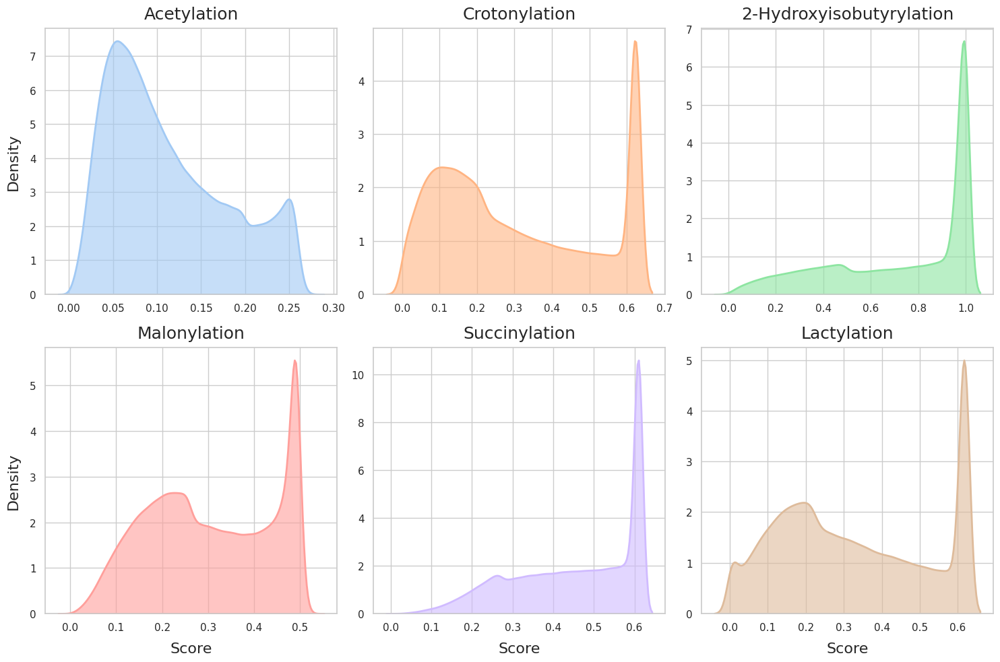

In [9]:
import seaborn as sns
import matplotlib.pyplot as plt
pdict = {'Kac':'Acetylation', 'Kcr':'Crotonylation', 'Kmal':'Malonylation', 
         'Ksucc':'Succinylation', 'Khib':'2-Hydroxyisobutyrylation', 'Kla':'Lactylation'}
# 设置绘图样式
sns.set(style="whitegrid")

# 获取 PTM 的分类列表
ptm_categories = df['PTM'].unique()

# 设置颜色和线型
palette = sns.color_palette("pastel", n_colors=len(ptm_categories))

# 创建一个 2x3 的子图布局 (6 个子图)
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

# 将 axes 展开为一维数组，以便遍历
axes = axes.flatten()

# 创建子图
for i, ptm in enumerate(ptm_categories):
    ax = axes[i]
    # 规范化 Score 列
#     df['Score_norm'] = df[['Score']].apply(normalize)
    p = df[df['PTM']==ptm].copy()
    p['Score_norm'] = df[['Score']].apply(normalize)
    
    # 绘制当前 PTM 的分布图（KDE）
    sns.kdeplot(data=p, x='Score_norm', color=palette[i], linewidth=2, fill=True, common_norm=True, alpha=0.6, ax=ax)
    
    # 设置标题和标签
    ax.set_title(f'{pdict[ptm]}', fontsize=18, pad=10)
    if i > 2:
        ax.set_xlabel('Score', fontsize=16, labelpad=10)
    else:
        ax.set_xlabel('')
    if i == 0 or  i ==3:
        ax.set_ylabel('Density', fontsize=16, labelpad=10)
    else:
        ax.set_ylabel('')
#     ax.grid(False)

# 调整布局
plt.tight_layout()

# 保存图片
plt.savefig('acylome_score_distribution_subplots.png', dpi=600)

In [624]:
i

5